### Notebook Contents

In accordance with procedure discussed from 6/4/2024 meeting to 7/2/2024 meeting.

Only considers exposure/damage that occurs at and above the "moderate" threshold according to First Street.
Flood Factor value of at least 3 is required to be considered exposed.

    Exposure3up ≡ Weighted FF Sum 3up = 3*(# parcels w/ FF=3) + 4*(# parcels w/ FF=4) + ... + 10*(# parcels w/ FF=10)
    Ascending Sort
    Total, White/Nonwhite
        Other Demographics (Black/Nonblack, etc.) - Depends on regional clustering of demographic
    
    All Coastal States - All Coastal Counties containing 6 or more Census Tracts - Coastal States only considering their Coastal Counties
        Lorenz Curves
        Gini Index Calculation
        Area under Lorenz Curves (Removed due to redundancy with Gini)
        Inequality Index Calculation
        Distance Correlation
        Comparison Plots
            y-axis
                Gini, II, Distance Correlation
            x-axis
                Population Density
                Median Household Income
                Median Household Value
                High School Education

## Coastal States

States (including D.C.) in the contiguous U.S. containing coastal counties according to NOAA Fisheries.

    https://www.fisheries.noaa.gov/inport/item/66112
    Includes AL and HI (NOT included in analysis)

### White and Nonwhite

In [244]:
import os
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import dcor

In [245]:
df_all = pd.read_csv('data/tract_all.csv')
df_all = df_all.rename(columns={'pop_total':'total'})
df_all = df_all.dropna(subset=['GEOID','NAME','total','white','nonwhite','FFsum3up'])
df_all = df_all[df_all['FFsum3up'] != 0]

C:\Program Files\ArcGIS\Pro\bin\Python\envs\arcgispro-py3\lib\site-packages\ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


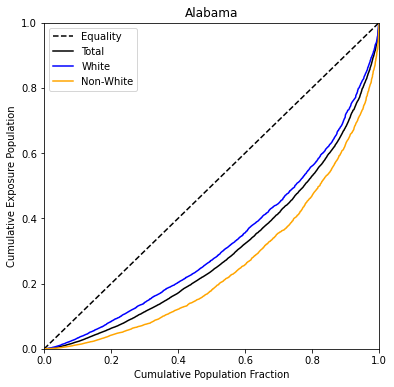

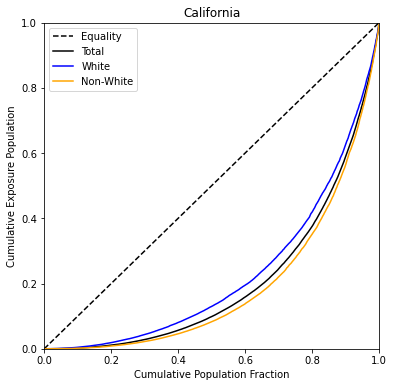

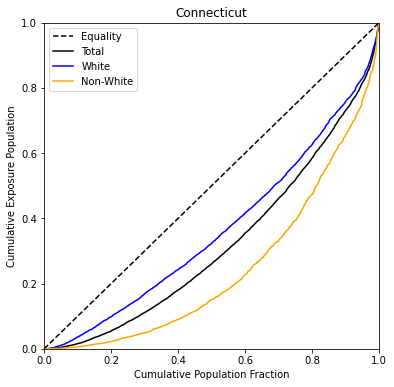

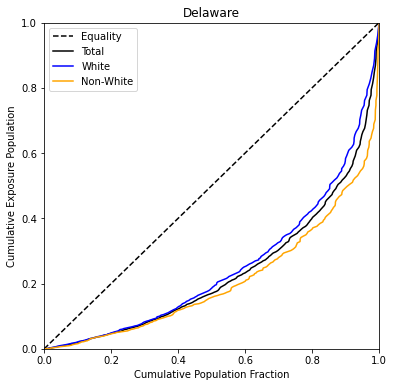

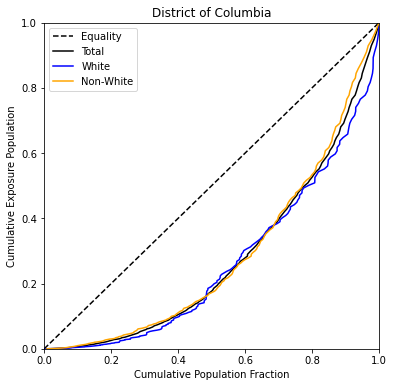

...

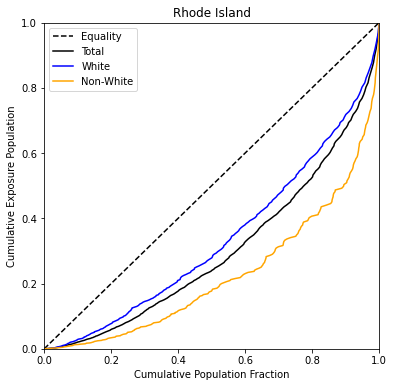

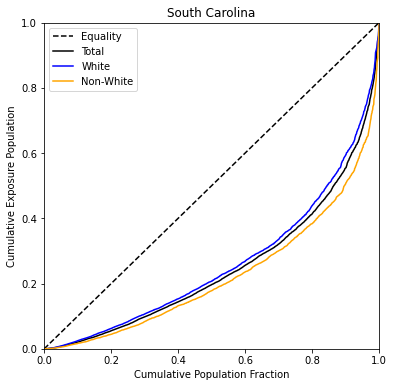

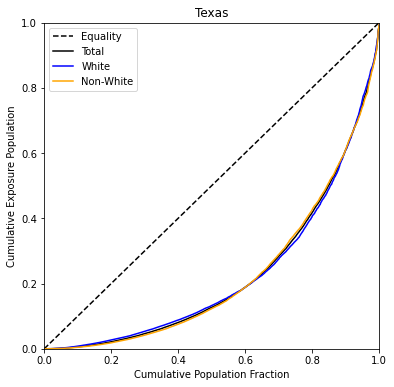

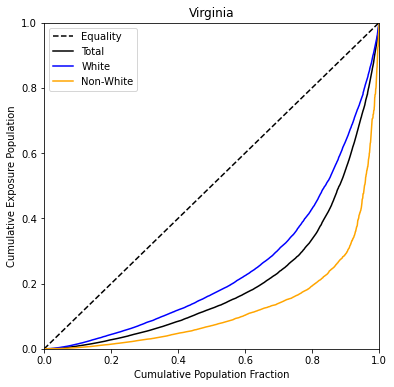

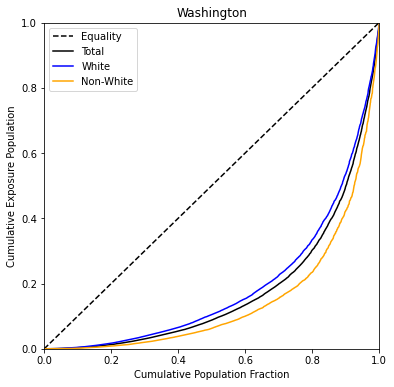

In [246]:
# lorenz curves
coastalstates = ['Alabama', 'California', 'Connecticut', 'Delaware', 'District of Columbia', 
                 'Florida', 'Georgia', 'Louisiana', 'Maine', 'Maryland', 
                 'Massachusetts', 'Mississippi', 'New Hampshire', 'New Jersey', 'New York', 
                 'North Carolina', 'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina', 
                 'Texas', 'Virginia', 'Washington']

for i in coastalstates:
    # start of calculations
    df_state = df_all[df_all['NAME'].str.endswith(i)]
    
    df_state_total = df_state[['GEOID','NAME','total','FFsum3up']]
    df_state_total = df_state_total.sort_values(by=['FFsum3up'],ascending=True) # weighted FF sum serves as the "exposure" value for sorting and analysis
    df_state_total['cum_pop'] = df_state_total['total'].cumsum()
    df_state_total['cum_FFsum3up'] = df_state_total['FFsum3up'].cumsum()
    df_state_total['normalized_pop'] = df_state_total['cum_pop']/df_state_total['total'].sum()
    df_state_total['normalized_FFsum3up'] = df_state_total['cum_FFsum3up']/df_state_total['FFsum3up'].sum()
    
    df_state_white = df_state[['GEOID','NAME','white','FFsum3up']]
    df_state_white = df_state_white.sort_values(by=['FFsum3up'],ascending=True)
    df_state_white['cum_pop'] = df_state_white['white'].cumsum()
    df_state_white['cum_FFsum3up'] = df_state_white['FFsum3up'].cumsum()
    df_state_white['normalized_pop'] = df_state_white['cum_pop']/df_state_white['white'].sum()
    df_state_white['normalized_FFsum3up'] = df_state_white['cum_FFsum3up']/df_state_white['FFsum3up'].sum()
    
    df_state_nonwhite = df_state[['GEOID','NAME','nonwhite','FFsum3up']]
    df_state_nonwhite = df_state_nonwhite.sort_values(by=['FFsum3up'],ascending=True)
    df_state_nonwhite['cum_pop'] = df_state_nonwhite['nonwhite'].cumsum()
    df_state_nonwhite['cum_FFsum3up'] = df_state_nonwhite['FFsum3up'].cumsum()
    df_state_nonwhite['normalized_pop'] = df_state_nonwhite['cum_pop']/df_state_nonwhite['nonwhite'].sum()
    df_state_nonwhite['normalized_FFsum3up'] = df_state_nonwhite['cum_FFsum3up']/df_state_nonwhite['FFsum3up'].sum()
    # end of calculations
    
    # start of plotting
    fig, ax = plt.subplots(figsize=(6,6))
    ax.set_title(i)
    
    x = np.arange(0, 1.1, 0.1) # equations to define eqaulity
    y = x
    
    ax.plot(x, y, color='black',linestyle='--')
    ax.plot(df_state_total['normalized_pop'],df_state_total['normalized_FFsum3up'],color='black',linestyle='-')
    ax.plot(df_state_white['normalized_pop'],df_state_white['normalized_FFsum3up'],color='blue',linestyle='-')
    ax.plot(df_state_nonwhite['normalized_pop'],df_state_nonwhite['normalized_FFsum3up'],color='orange',linestyle='-')
    
    ax.set_xlim(0,1)
    ax.set_ylim(0,1)
    ax.set_xlabel('Cumulative Population Fraction')
    ax.set_ylabel('Cumulative Exposure Population')
    ax.legend(['Equality','Total','White','Non-White'],loc=2)
    
    plt.savefig('results/LorenzCurves/CoastalStates/'+i+'_white', dpi=300, bbox_inches='tight')
    # end of plotting

In [247]:
# csv generation (gini, I)
coastalstates = ['Alabama', 'California', 'Connecticut', 'Delaware', 'District of Columbia', 
                 'Florida', 'Georgia', 'Louisiana', 'Maine', 'Maryland', 
                 'Massachusetts', 'Mississippi', 'New Hampshire', 'New Jersey', 'New York', 
                 'North Carolina', 'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina', 
                 'Texas', 'Virginia', 'Washington']

df_coastalstates = pd.DataFrame(columns=['State','poptotal','popwhite','popnonwhite','Gini_total','Gini_white','Gini_nonwhite','II_total','II_white','II_nonwhite','dc_total','dc_white','dc_nonwhite','Area_km2','medHincome','medHvalue','edu'])

for i in coastalstates:
    # start of calculations
    df_state = df_all[df_all['NAME'].str.endswith(i)]
    
    df_state_total = df_state[['GEOID','NAME','total','FFsum3up','Area_km2','medHincome','medHvalue','edu']]
    df_state_total = df_state_total.sort_values(by=['FFsum3up'],ascending=True) # weighted FF sum serves as the "exposure" value for sorting and analysis
    df_state_total['cum_pop'] = df_state_total['total'].cumsum()
    df_state_total['cum_FFsum3up'] = df_state_total['FFsum3up'].cumsum()
    df_state_total['normalized_pop'] = df_state_total['cum_pop']/df_state_total['total'].sum()
    df_state_total['normalized_FFsum3up'] = df_state_total['cum_FFsum3up']/df_state_total['FFsum3up'].sum()
    
    df_state_white = df_state[['GEOID','NAME','white','FFsum3up']]
    df_state_white = df_state_white.sort_values(by=['FFsum3up'],ascending=True)
    df_state_white['cum_pop'] = df_state_white['white'].cumsum()
    df_state_white['cum_FFsum3up'] = df_state_white['FFsum3up'].cumsum()
    df_state_white['normalized_pop'] = df_state_white['cum_pop']/df_state_white['white'].sum()
    df_state_white['normalized_FFsum3up'] = df_state_white['cum_FFsum3up']/df_state_white['FFsum3up'].sum()
    
    df_state_nonwhite = df_state[['GEOID','NAME','nonwhite','FFsum3up']]
    df_state_nonwhite = df_state_nonwhite.sort_values(by=['FFsum3up'],ascending=True)
    df_state_nonwhite['cum_pop'] = df_state_nonwhite['nonwhite'].cumsum()
    df_state_nonwhite['cum_FFsum3up'] = df_state_nonwhite['FFsum3up'].cumsum()
    df_state_nonwhite['normalized_pop'] = df_state_nonwhite['cum_pop']/df_state_nonwhite['nonwhite'].sum()
    df_state_nonwhite['normalized_FFsum3up'] = df_state_nonwhite['cum_FFsum3up']/df_state_nonwhite['FFsum3up'].sum()
    
    poptotal = df_state_total['total'].sum()
    popwhite = df_state_white['white'].sum()
    popnonwhite = df_state_nonwhite['nonwhite'].sum()
    
    Gini_total = (0.5 - np.trapz(df_state_total['normalized_FFsum3up'],df_state_total['normalized_pop']))/0.5
    Gini_white = (0.5 - np.trapz(df_state_white['normalized_FFsum3up'],df_state_white['normalized_pop']))/0.5
    Gini_nonwhite = (0.5 - np.trapz(df_state_nonwhite['normalized_FFsum3up'],df_state_nonwhite['normalized_pop']))/0.5
    
    B10T10_total = np.percentile(df_state_total['normalized_FFsum3up'],10)/(1-np.percentile(df_state_total['normalized_FFsum3up'],90))
    B10T10_white = np.percentile(df_state_white['normalized_FFsum3up'],10)/(1-np.percentile(df_state_white['normalized_FFsum3up'],90))
    B10T10_nonwhite = np.percentile(df_state_nonwhite['normalized_FFsum3up'],10)/(1-np.percentile(df_state_nonwhite['normalized_FFsum3up'],90))
    II_total = np.sqrt((Gini_total**2)+(((1-B10T10_total)**(1/4))**2))/np.sqrt(2) # value of 1/4 is used by Sitthyot et al. (2020), this alpha value is based, then rounded for practicality, on average of all country Gini values
    II_white = np.sqrt((Gini_white**2)+(((1-B10T10_white)**(1/4))**2))/np.sqrt(2)
    II_nonwhite = np.sqrt((Gini_nonwhite**2)+(((1-B10T10_nonwhite)**(1/4))**2))/np.sqrt(2)
    
    dc_total = dcor.distance_correlation(df_state_total['normalized_pop'],df_state_total['normalized_FFsum3up'])
    dc_white = dcor.distance_correlation(df_state_white['normalized_pop'],df_state_white['normalized_FFsum3up'])
    dc_nonwhite = dcor.distance_correlation(df_state_nonwhite['normalized_pop'],df_state_nonwhite['normalized_FFsum3up'])
    
    Area_km2 = df_state_total['Area_km2'].sum()
    medHincome_ave = df_state_total['medHincome'].mean()
    medHvalue_ave = df_state_total['medHvalue'].mean()
    edu_ave = (df_state_total['edu']/df_state_total['total']).mean()
    # end of calculations
    
    # start of results synthesis
    df_coastalstates = df_coastalstates.append({'State':i,'poptotal':poptotal,'popwhite':popwhite,'popnonwhite':popnonwhite,
                                                'Gini_total':Gini_total,'Gini_white':Gini_white,'Gini_nonwhite':Gini_nonwhite,
                                                'II_total':II_total,'II_white':II_white,'II_nonwhite':II_nonwhite,
                                                'dc_total':dc_total,'dc_white':dc_white,'dc_nonwhite':dc_nonwhite,
                                                'Area_km2':Area_km2,'medHincome':medHincome_ave,'medHvalue':medHvalue_ave,'edu':edu_ave}, ignore_index=True)
    
df_coastalstates.to_csv('results/csvs/CoastalStates_white.csv', index=False)
# end of results synthesis

In [209]:
# reading generated csv
df_white = pd.read_csv('results/csvs/CoastalStates_white.csv')

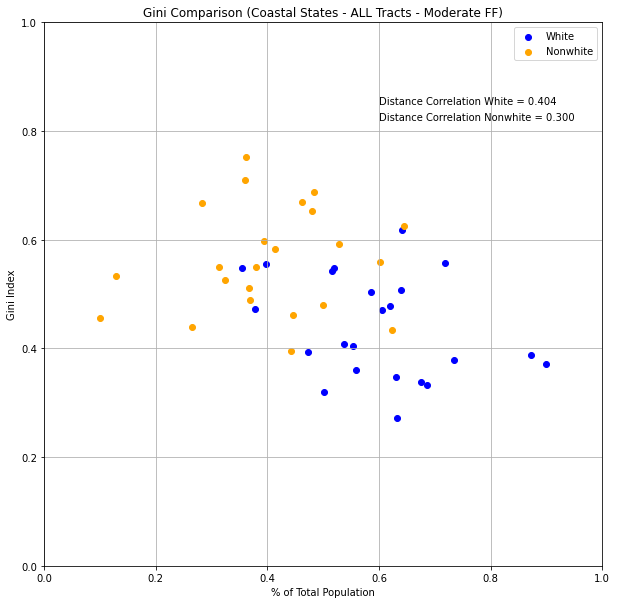

In [210]:
# correlation plotting (gini - pop density)
fig, ax = plt.subplots(figsize=(10,10))

ax.scatter(df_white['popwhite']/df_white['poptotal'], df_white['Gini_white'], color='blue')
ax.scatter(df_white['popnonwhite']/df_white['poptotal'], df_white['Gini_nonwhite'], color='orange')

ax.set_title('Gini Comparison (Coastal States - ALL Tracts - Moderate FF)')
ax.set_xlim(0,1)
ax.set_ylim(0,1)
ax.set_xlabel('% of Total Population')
ax.set_ylabel('Gini Index')
ax.legend(['White','Nonwhite'],loc=1)
ax.grid(True)

dcor_white = dcor.distance_correlation(df_white['popwhite']/df_white['poptotal'], df_white['Gini_white'])
dcor_nonwhite = dcor.distance_correlation(df_white['popnonwhite']/df_white['poptotal'], df_white['Gini_nonwhite'])
ax.annotate('Distance Correlation White = ''%.3f'%(dcor_white),xy=(0.6,0.85),xytext=(0.6,0.85),fontsize=10)
ax.annotate('Distance Correlation Nonwhite = ''%.3f'%(dcor_nonwhite),xy=(0.6,0.82),xytext=(0.6,0.82),fontsize=10)

plt.savefig('results/ComparisonPlots/CoastalStates/CoastalStates_white_gini_pd', dpi=300, bbox_inches='tight')

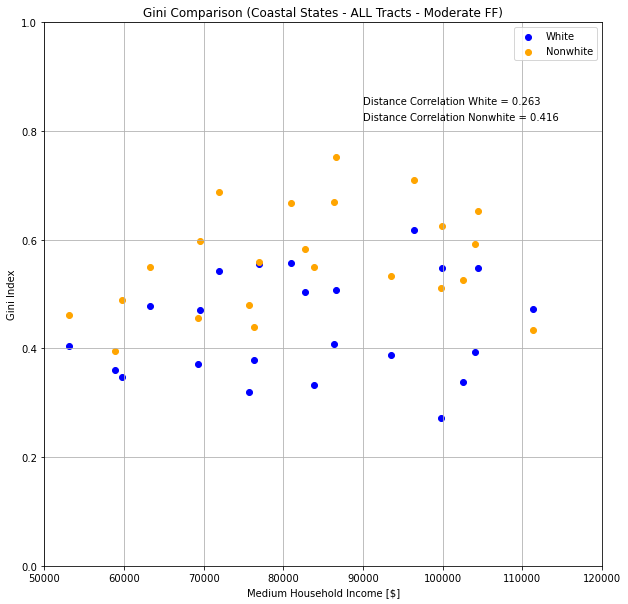

In [211]:
# correlation plotting (gini - medhincome)
fig, ax = plt.subplots(figsize=(10,10))

ax.scatter(df_white['medHincome'], df_white['Gini_white'], color='blue')
ax.scatter(df_white['medHincome'], df_white['Gini_nonwhite'], color='orange')

ax.set_title('Gini Comparison (Coastal States - ALL Tracts - Moderate FF)')
ax.set_xlim(50000,120000)
ax.set_ylim(0,1)
ax.set_xlabel('Medium Household Income [$]')
ax.set_ylabel('Gini Index')
ax.legend(['White','Nonwhite'],loc=1)
ax.grid(True)
dcor_white = dcor.distance_correlation(df_white['medHincome'], df_white['Gini_white'])
dcor_nonwhite = dcor.distance_correlation(df_white['medHincome'], df_white['Gini_nonwhite'])
ax.annotate('Distance Correlation White = ''%.3f'%(dcor_white),xy=(90000,0.85),xytext=(90000,0.85),fontsize=10)
ax.annotate('Distance Correlation Nonwhite = ''%.3f'%(dcor_nonwhite),xy=(90000,0.82),xytext=(90000,0.82),fontsize=10)

plt.savefig('results/ComparisonPlots/CoastalStates/CoastalStates_white_gini_medHincome', dpi=300, bbox_inches='tight')

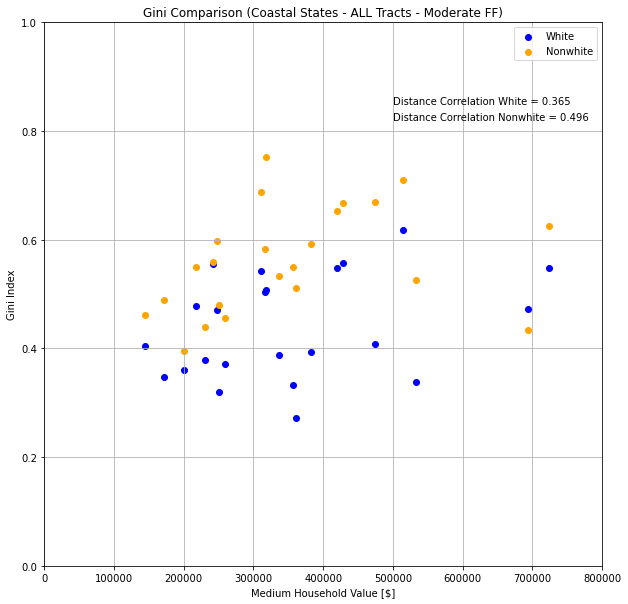

In [212]:
# correlation plotting (gini - medhvalue)
fig, ax = plt.subplots(figsize=(10,10))

ax.scatter(df_white['medHvalue'], df_white['Gini_white'], color='blue')
ax.scatter(df_white['medHvalue'], df_white['Gini_nonwhite'], color='orange')

ax.set_title('Gini Comparison (Coastal States - ALL Tracts - Moderate FF)')
ax.set_xlim(0,800000)
ax.set_ylim(0,1)
ax.set_xlabel('Medium Household Value [$]')
ax.set_ylabel('Gini Index')
ax.legend(['White','Nonwhite'],loc=1)
ax.grid(True)
dcor_white = dcor.distance_correlation(df_white['medHvalue'], df_white['Gini_white'])
dcor_nonwhite = dcor.distance_correlation(df_white['medHvalue'], df_white['Gini_nonwhite'])
ax.annotate('Distance Correlation White = ''%.3f'%(dcor_white),xy=(500000,0.85),xytext=(500000,0.85),fontsize=10)
ax.annotate('Distance Correlation Nonwhite = ''%.3f'%(dcor_nonwhite),xy=(500000,0.82),xytext=(500000,0.82),fontsize=10)

plt.savefig('results/ComparisonPlots/CoastalStates/CoastalStates_white_gini_medHvalue', dpi=300, bbox_inches='tight')

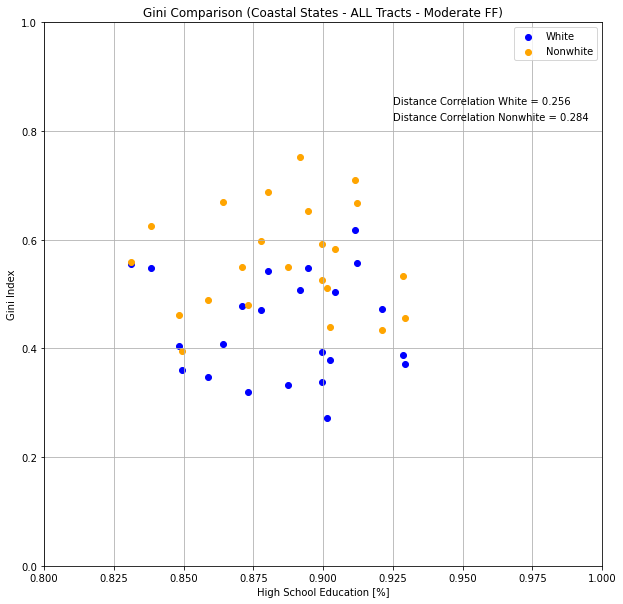

In [213]:
# correlation plotting (gini - education)
fig, ax = plt.subplots(figsize=(10,10))

ax.scatter(df_white['edu'], df_white['Gini_white'], color='blue')
ax.scatter(df_white['edu'], df_white['Gini_nonwhite'], color='orange')

ax.set_title('Gini Comparison (Coastal States - ALL Tracts - Moderate FF)')
ax.set_xlim(0.8,1)
ax.set_ylim(0,1)
ax.set_xlabel('High School Education [%]')
ax.set_ylabel('Gini Index')
ax.legend(['White','Nonwhite'],loc=1)
ax.grid(True)
dcor_white = dcor.distance_correlation(df_white['edu'], df_white['Gini_white'])
dcor_nonwhite = dcor.distance_correlation(df_white['edu'], df_white['Gini_nonwhite'])
ax.annotate('Distance Correlation White = ''%.3f'%(dcor_white),xy=(0.925,0.85),xytext=(0.925,0.85),fontsize=10)
ax.annotate('Distance Correlation Nonwhite = ''%.3f'%(dcor_nonwhite),xy=(0.925,0.82),xytext=(0.925,0.82),fontsize=10)

plt.savefig('results/ComparisonPlots/CoastalStates/CoastalStates_white_gini_edu', dpi=300, bbox_inches='tight')

Text(0.625, 0.87, 'Distance Correlation Nonwhite = 0.311')

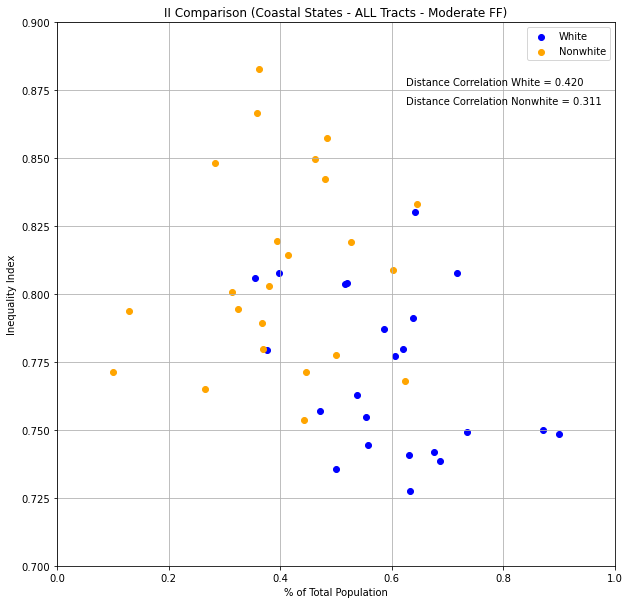

In [216]:
# correlation plotting (II - pop density)
fig, ax = plt.subplots(figsize=(10,10))

ax.scatter(df_white['popwhite']/df_white['poptotal'], df_white['II_white'], color='blue')
ax.scatter(df_white['popnonwhite']/df_white['poptotal'], df_white['II_nonwhite'], color='orange')

ax.set_title('II Comparison (Coastal States - ALL Tracts - Moderate FF)')
ax.set_xlim(0,1)
ax.set_ylim(0.7,0.9)
ax.set_xlabel('% of Total Population')
ax.set_ylabel('Inequality Index')
ax.legend(['White','Nonwhite'],loc=1)
ax.grid(True)
dcor_white = dcor.distance_correlation(df_white['popwhite']/df_white['poptotal'], df_white['II_white'])
dcor_nonwhite = dcor.distance_correlation(df_white['popnonwhite']/df_white['poptotal'], df_white['II_nonwhite'])
ax.annotate('Distance Correlation White = ''%.3f'%(dcor_white),xy=(0.625,0.877),xytext=(0.625,0.877),fontsize=10)
ax.annotate('Distance Correlation Nonwhite = ''%.3f'%(dcor_nonwhite),xy=(0.625,0.87),xytext=(0.625,0.87),fontsize=10)

#plt.savefig('results/ComparisonPlots/CoastalStates/CoastalStates_white_II_pd', dpi=300, bbox_inches='tight')

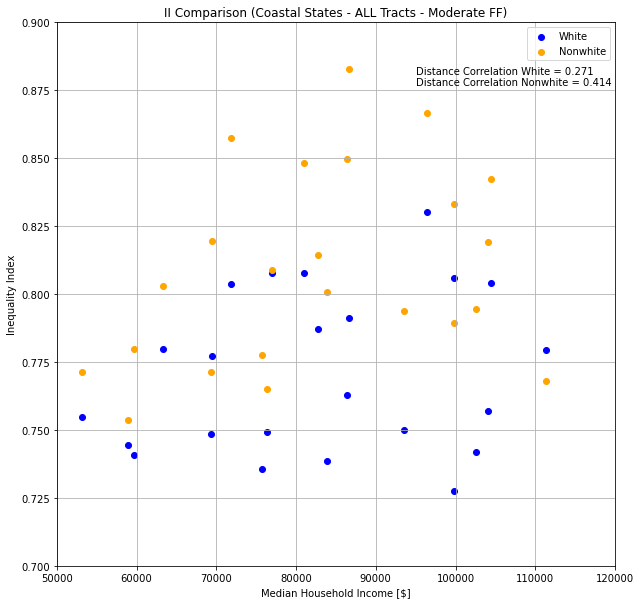

In [217]:
# correlation plotting (II - medHincome)
fig, ax = plt.subplots(figsize=(10,10))

ax.scatter(df_white['medHincome'], df_white['II_white'], color='blue')
ax.scatter(df_white['medHincome'], df_white['II_nonwhite'], color='orange')

ax.set_title('II Comparison (Coastal States - ALL Tracts - Moderate FF)')
ax.set_xlim(50000,120000)
ax.set_ylim(0.7,0.9)
ax.set_xlabel('Median Household Income [$]')
ax.set_ylabel('Inequality Index')
ax.legend(['White','Nonwhite'],loc=1)
ax.grid(True)
dcor_white = dcor.distance_correlation(df_white['medHincome'], df_white['II_white'])
dcor_nonwhite = dcor.distance_correlation(df_white['medHincome'], df_white['II_nonwhite'])
ax.annotate('Distance Correlation White = ''%.3f'%(dcor_white),xy=(95000,0.881),xytext=(95000,0.881),fontsize=10)
ax.annotate('Distance Correlation Nonwhite = ''%.3f'%(dcor_nonwhite),xy=(95000,0.877),xytext=(95000,0.877),fontsize=10)

plt.savefig('results/ComparisonPlots/CoastalStates/CoastalStates_white_II_medHincome', dpi=300, bbox_inches='tight')

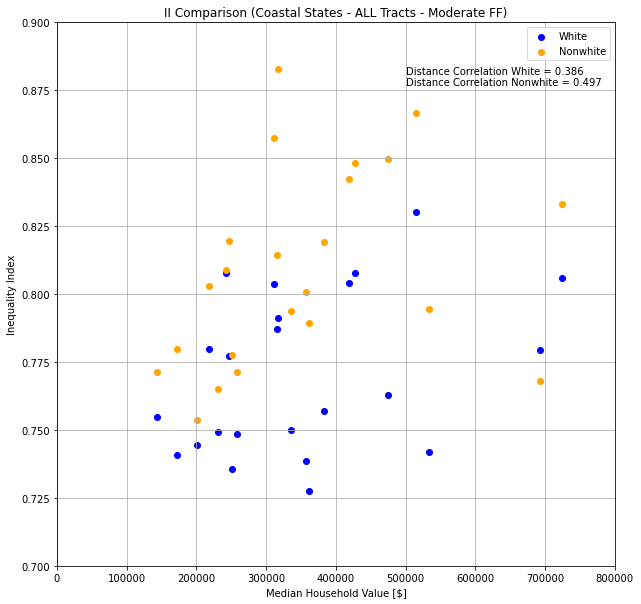

In [218]:
# correlation plotting (II - medHvalue)
fig, ax = plt.subplots(figsize=(10,10))

ax.scatter(df_white['medHvalue'], df_white['II_white'], color='blue')
ax.scatter(df_white['medHvalue'], df_white['II_nonwhite'], color='orange')

ax.set_title('II Comparison (Coastal States - ALL Tracts - Moderate FF)')
ax.set_xlim(0,800000)
ax.set_ylim(0.7,0.9)
ax.set_xlabel('Median Household Value [$]')
ax.set_ylabel('Inequality Index')
ax.legend(['White','Nonwhite'],loc=1)
ax.grid(True)
dcor_white = dcor.distance_correlation(df_white['medHvalue'], df_white['II_white'])
dcor_nonwhite = dcor.distance_correlation(df_white['medHvalue'], df_white['II_nonwhite'])
ax.annotate('Distance Correlation White = ''%.3f'%(dcor_white),xy=(50000,0.881),xytext=(500000,0.881),fontsize=10)
ax.annotate('Distance Correlation Nonwhite = ''%.3f'%(dcor_nonwhite),xy=(500000,0.877),xytext=(500000,0.877),fontsize=10)

plt.savefig('results/ComparisonPlots/CoastalStates/CoastalStates_white_II_medHvalue', dpi=300, bbox_inches='tight')

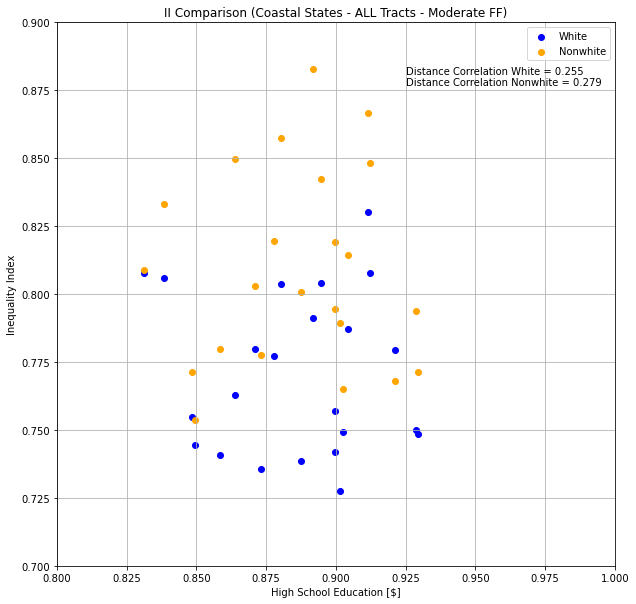

In [219]:
# correlation plotting (II - education)
fig, ax = plt.subplots(figsize=(10,10))

ax.scatter(df_white['edu'], df_white['II_white'], color='blue')
ax.scatter(df_white['edu'], df_white['II_nonwhite'], color='orange')

ax.set_title('II Comparison (Coastal States - ALL Tracts - Moderate FF)')
ax.set_xlim(0.8,1)
ax.set_ylim(0.7,0.9)
ax.set_xlabel('High School Education [$]')
ax.set_ylabel('Inequality Index')
ax.legend(['White','Nonwhite'],loc=1)
ax.grid(True)
dcor_white = dcor.distance_correlation(df_white['edu'], df_white['II_white'])
dcor_nonwhite = dcor.distance_correlation(df_white['edu'], df_white['II_nonwhite'])
ax.annotate('Distance Correlation White = ''%.3f'%(dcor_white),xy=(0.925,0.881),xytext=(0.925,0.881),fontsize=10)
ax.annotate('Distance Correlation Nonwhite = ''%.3f'%(dcor_nonwhite),xy=(0.925,0.877),xytext=(0.925,0.877),fontsize=10)

plt.savefig('results/ComparisonPlots/CoastalStates/CoastalStates_white_II_edu', dpi=300, bbox_inches='tight')

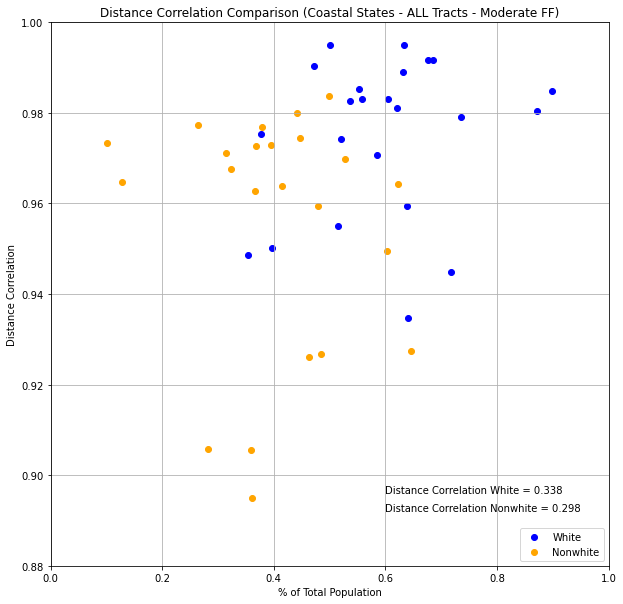

In [220]:
# correlation plotting (dc - pop density)
fig, ax = plt.subplots(figsize=(10,10))

ax.scatter(df_white['popwhite']/df_white['poptotal'], df_white['dc_white'], color='blue')
ax.scatter(df_white['popnonwhite']/df_white['poptotal'], df_white['dc_nonwhite'], color='orange')

ax.set_title('Distance Correlation Comparison (Coastal States - ALL Tracts - Moderate FF)')
ax.set_xlim(0,1)
ax.set_ylim(0.88,1)
ax.set_xlabel('% of Total Population')
ax.set_ylabel('Distance Correlation')
ax.legend(['White','Nonwhite'],loc=4)
ax.grid(True)
dcor_white = dcor.distance_correlation(df_white['popwhite']/df_white['poptotal'], df_white['dc_white'])
dcor_nonwhite = dcor.distance_correlation(df_white['popnonwhite']/df_white['poptotal'], df_white['dc_nonwhite'])
ax.annotate('Distance Correlation White = ''%.3f'%(dcor_white),xy=(0.6,0.896),xytext=(0.6,0.896),fontsize=10)
ax.annotate('Distance Correlation Nonwhite = ''%.3f'%(dcor_nonwhite),xy=(0.6,0.892),xytext=(0.6,0.892),fontsize=10)

plt.savefig('results/ComparisonPlots/CoastalStates/CoastalStates_white_dc_pd', dpi=300, bbox_inches='tight')

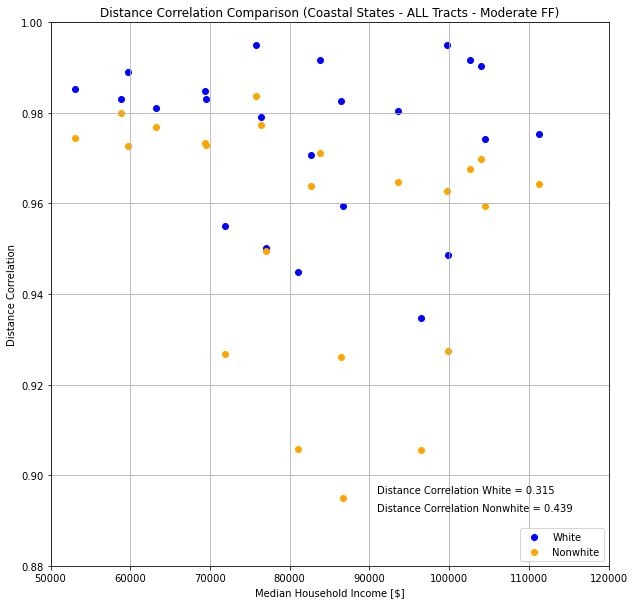

In [221]:
# correlation plotting (dc - medHincome)
fig, ax = plt.subplots(figsize=(10,10))

ax.scatter(df_white['medHincome'], df_white['dc_white'], color='blue')
ax.scatter(df_white['medHincome'], df_white['dc_nonwhite'], color='orange')

ax.set_title('Distance Correlation Comparison (Coastal States - ALL Tracts - Moderate FF)')
ax.set_xlim(50000,120000)
ax.set_ylim(0.88,1)
ax.set_xlabel('Median Household Income [$]')
ax.set_ylabel('Distance Correlation')
ax.legend(['White','Nonwhite'],loc=4)
ax.grid(True)
dcor_white = dcor.distance_correlation(df_white['medHincome'], df_white['dc_white'])
dcor_nonwhite = dcor.distance_correlation(df_white['medHincome'], df_white['dc_nonwhite'])
ax.annotate('Distance Correlation White = ''%.3f'%(dcor_white),xy=(91000,0.896),xytext=(91000,0.896),fontsize=10)
ax.annotate('Distance Correlation Nonwhite = ''%.3f'%(dcor_nonwhite),xy=(91000,0.892),xytext=(91000,0.892),fontsize=10)

plt.savefig('results/ComparisonPlots/CoastalStates/CoastalStates_white_dc_medHincome', dpi=300, bbox_inches='tight')

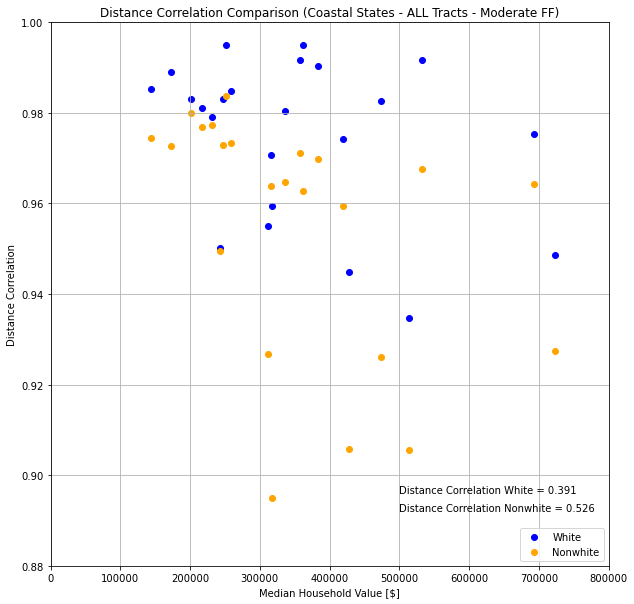

In [222]:
# correlation plotting (dc - medHvalue)
fig, ax = plt.subplots(figsize=(10,10))

ax.scatter(df_white['medHvalue'], df_white['dc_white'], color='blue')
ax.scatter(df_white['medHvalue'], df_white['dc_nonwhite'], color='orange')

ax.set_title('Distance Correlation Comparison (Coastal States - ALL Tracts - Moderate FF)')
ax.set_xlim(0,800000)
ax.set_ylim(0.88,1)
ax.set_xlabel('Median Household Value [$]')
ax.set_ylabel('Distance Correlation')
ax.legend(['White','Nonwhite'],loc=4)
ax.grid(True)
dcor_white = dcor.distance_correlation(df_white['medHvalue'], df_white['dc_white'])
dcor_nonwhite = dcor.distance_correlation(df_white['medHvalue'], df_white['dc_nonwhite'])
ax.annotate('Distance Correlation White = ''%.3f'%(dcor_white),xy=(500000,0.896),xytext=(500000,0.896),fontsize=10)
ax.annotate('Distance Correlation Nonwhite = ''%.3f'%(dcor_nonwhite),xy=(500000,0.892),xytext=(500000,0.892),fontsize=10)

plt.savefig('results/ComparisonPlots/CoastalStates/CoastalStates_white_dc_medHvalue', dpi=300, bbox_inches='tight')

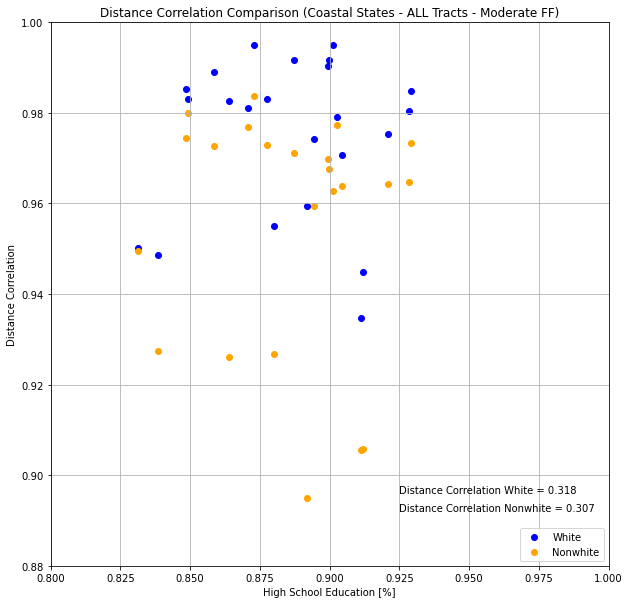

In [223]:
# correlation plotting (dc - edu)
fig, ax = plt.subplots(figsize=(10,10))

ax.scatter(df_white['edu'], df_white['dc_white'], color='blue')
ax.scatter(df_white['edu'], df_white['dc_nonwhite'], color='orange')

ax.set_title('Distance Correlation Comparison (Coastal States - ALL Tracts - Moderate FF)')
ax.set_xlim(0.8,1)
ax.set_ylim(0.88,1)
ax.set_xlabel('High School Education [%]')
ax.set_ylabel('Distance Correlation')
ax.legend(['White','Nonwhite'],loc=4)
ax.grid(True)
dcor_white = dcor.distance_correlation(df_white['edu'], df_white['dc_white'])
dcor_nonwhite = dcor.distance_correlation(df_white['edu'], df_white['dc_nonwhite'])
ax.annotate('Distance Correlation White = ''%.3f'%(dcor_white),xy=(0.925,0.896),xytext=(0.925,0.896),fontsize=10)
ax.annotate('Distance Correlation Nonwhite = ''%.3f'%(dcor_nonwhite),xy=(0.925,0.892),xytext=(0.925,0.892),fontsize=10)

plt.savefig('results/ComparisonPlots/CoastalStates/CoastalStates_white_dc_edu', dpi=300, bbox_inches='tight')

### Black and Nonblack

In [224]:
import os
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import dcor

In [225]:
df_all = pd.read_csv('data/tract_all.csv')
df_all = df_all.rename(columns={'pop_total':'total'})
df_all = df_all.dropna(subset=['GEOID','NAME','total','black','nonblack','FFsum3up'])
df_all = df_all[df_all['FFsum3up'] != 0]

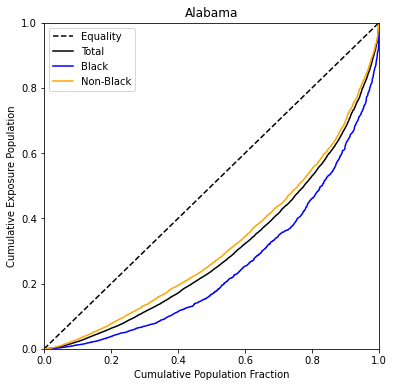

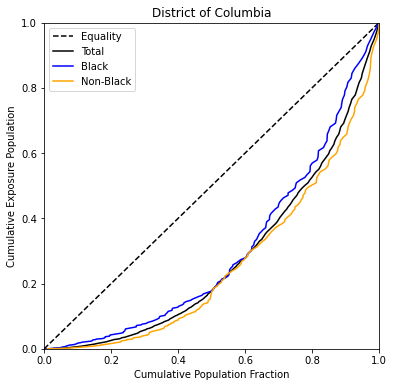

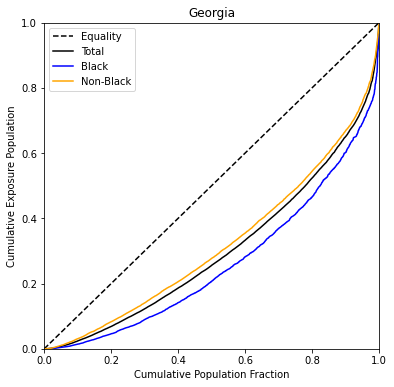

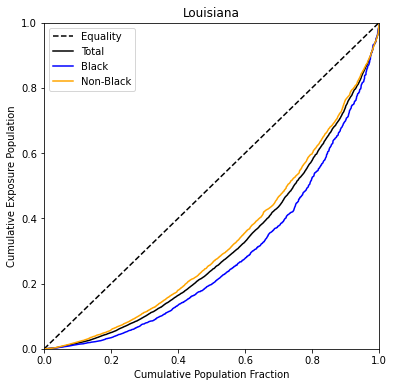

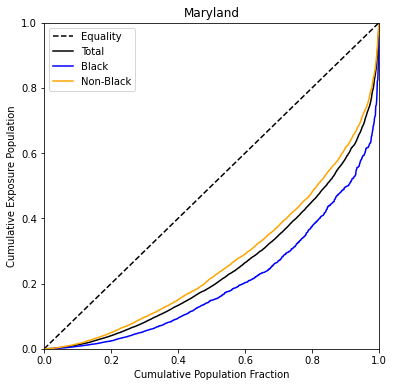

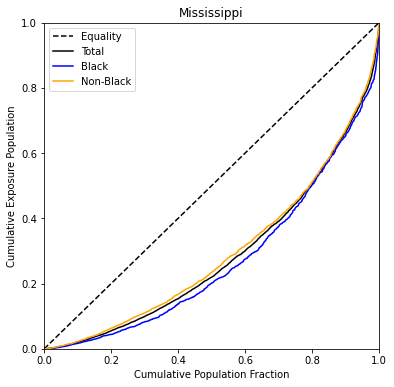

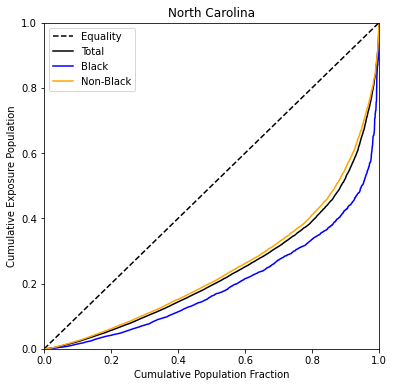

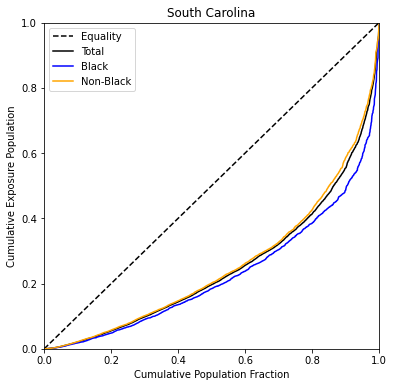

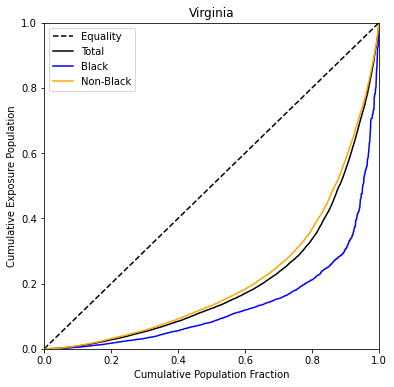

In [226]:
# lorenz curves
blackstates = ['Alabama', 'District of Columbia', 'Georgia', 'Louisiana','Maryland', 
               'Mississippi', 'North Carolina', 'South Carolina', 'Virginia']

for i in blackstates:
    # start of calculations
    df_state = df_all[df_all['NAME'].str.endswith(i)]
    
    df_state_total = df_state[['GEOID','NAME','total','FFsum3up']]
    df_state_total = df_state_total.sort_values(by=['FFsum3up'],ascending=True) # weighted FF sum serves as the "exposure" value for sorting and analysis
    df_state_total['cum_pop'] = df_state_total['total'].cumsum()
    df_state_total['cum_FFsum3up'] = df_state_total['FFsum3up'].cumsum()
    df_state_total['normalized_pop'] = df_state_total['cum_pop']/df_state_total['total'].sum()
    df_state_total['normalized_FFsum3up'] = df_state_total['cum_FFsum3up']/df_state_total['FFsum3up'].sum()
    
    df_state_black = df_state[['GEOID','NAME','black','FFsum3up']]
    df_state_black = df_state_black.sort_values(by=['FFsum3up'],ascending=True)
    df_state_black['cum_pop'] = df_state_black['black'].cumsum()
    df_state_black['cum_FFsum3up'] = df_state_black['FFsum3up'].cumsum()
    df_state_black['normalized_pop'] = df_state_black['cum_pop']/df_state_black['black'].sum()
    df_state_black['normalized_FFsum3up'] = df_state_black['cum_FFsum3up']/df_state_black['FFsum3up'].sum()
    
    df_state_nonblack = df_state[['GEOID','NAME','nonblack','FFsum3up']]
    df_state_nonblack = df_state_nonblack.sort_values(by=['FFsum3up'],ascending=True)
    df_state_nonblack['cum_pop'] = df_state_nonblack['nonblack'].cumsum()
    df_state_nonblack['cum_FFsum3up'] = df_state_nonblack['FFsum3up'].cumsum()
    df_state_nonblack['normalized_pop'] = df_state_nonblack['cum_pop']/df_state_nonblack['nonblack'].sum()
    df_state_nonblack['normalized_FFsum3up'] = df_state_nonblack['cum_FFsum3up']/df_state_nonblack['FFsum3up'].sum()
    # end of calculations
    
    # start of plotting
    fig, ax = plt.subplots(figsize=(6,6))
    ax.set_title(i)
    
    x = np.arange(0, 1.1, 0.1) # equations to define eqaulity
    y = x
    
    ax.plot(x, y, color='black',linestyle='--')
    ax.plot(df_state_total['normalized_pop'],df_state_total['normalized_FFsum3up'],color='black',linestyle='-')
    ax.plot(df_state_black['normalized_pop'],df_state_black['normalized_FFsum3up'],color='blue',linestyle='-')
    ax.plot(df_state_nonblack['normalized_pop'],df_state_nonblack['normalized_FFsum3up'],color='orange',linestyle='-')
    
    ax.set_xlim(0,1)
    ax.set_ylim(0,1)
    ax.set_xlabel('Cumulative Population Fraction')
    ax.set_ylabel('Cumulative Exposure Population')
    ax.legend(['Equality','Total','Black','Non-Black'],loc=2)
    
    plt.savefig('results/LorenzCurves/CoastalStates/'+i+'_black', dpi=300, bbox_inches='tight')
    # end of plotting

In [227]:
# csv generation (gini, I)
blackstates = ['Alabama', 'District of Columbia', 'Georgia', 'Louisiana','Maryland', 
               'Mississippi', 'North Carolina', 'South Carolina', 'Virginia']

df_coastalstates = pd.DataFrame(columns=['State','poptotal','popblack','popnonblack','Gini_total','Gini_black','Gini_nonblack','II_total','II_black','II_nonblack','dc_total','dc_black','dc_nonblack','Area_km2','medHincome','medHvalue','edu'])

for i in blackstates:
    # start of calculations
    df_state = df_all[df_all['NAME'].str.endswith(i)]
    
    df_state_total = df_state[['GEOID','NAME','total','FFsum3up','Area_km2','medHincome','medHvalue','edu']]
    df_state_total = df_state_total.sort_values(by=['FFsum3up'],ascending=True) # weighted FF sum serves as the "exposure" value for sorting and analysis
    df_state_total['cum_pop'] = df_state_total['total'].cumsum()
    df_state_total['cum_FFsum3up'] = df_state_total['FFsum3up'].cumsum()
    df_state_total['normalized_pop'] = df_state_total['cum_pop']/df_state_total['total'].sum()
    df_state_total['normalized_FFsum3up'] = df_state_total['cum_FFsum3up']/df_state_total['FFsum3up'].sum()
    
    df_state_black = df_state[['GEOID','NAME','black','FFsum3up']]
    df_state_black = df_state_black.sort_values(by=['FFsum3up'],ascending=True)
    df_state_black['cum_pop'] = df_state_black['black'].cumsum()
    df_state_black['cum_FFsum3up'] = df_state_black['FFsum3up'].cumsum()
    df_state_black['normalized_pop'] = df_state_black['cum_pop']/df_state_black['black'].sum()
    df_state_black['normalized_FFsum3up'] = df_state_black['cum_FFsum3up']/df_state_black['FFsum3up'].sum()
    
    df_state_nonblack = df_state[['GEOID','NAME','nonblack','FFsum3up']]
    df_state_nonblack = df_state_nonblack.sort_values(by=['FFsum3up'],ascending=True)
    df_state_nonblack['cum_pop'] = df_state_nonblack['nonblack'].cumsum()
    df_state_nonblack['cum_FFsum3up'] = df_state_nonblack['FFsum3up'].cumsum()
    df_state_nonblack['normalized_pop'] = df_state_nonblack['cum_pop']/df_state_nonblack['nonblack'].sum()
    df_state_nonblack['normalized_FFsum3up'] = df_state_nonblack['cum_FFsum3up']/df_state_nonblack['FFsum3up'].sum()
    
    poptotal = df_state_total['total'].sum()
    popblack = df_state_black['black'].sum()
    popnonblack = df_state_nonblack['nonblack'].sum()
    
    Gini_total = (0.5 - np.trapz(df_state_total['normalized_FFsum3up'],df_state_total['normalized_pop']))/0.5
    Gini_black = (0.5 - np.trapz(df_state_black['normalized_FFsum3up'],df_state_black['normalized_pop']))/0.5
    Gini_nonblack = (0.5 - np.trapz(df_state_nonblack['normalized_FFsum3up'],df_state_nonblack['normalized_pop']))/0.5
    
    B10T10_total = np.percentile(df_state_total['normalized_FFsum3up'],10)/(1-np.percentile(df_state_total['normalized_FFsum3up'],90))
    B10T10_black = np.percentile(df_state_black['normalized_FFsum3up'],10)/(1-np.percentile(df_state_black['normalized_FFsum3up'],90))
    B10T10_nonblack = np.percentile(df_state_nonblack['normalized_FFsum3up'],10)/(1-np.percentile(df_state_nonblack['normalized_FFsum3up'],90))
    II_total = np.sqrt((Gini_total**2)+(((1-B10T10_total)**(1/4))**2))/np.sqrt(2) # value of 1/4 is used by Sitthyot et al. (2020), this alpha value is based, then rounded for practicality, on average of all country Gini values
    II_black = np.sqrt((Gini_black**2)+(((1-B10T10_black)**(1/4))**2))/np.sqrt(2)
    II_nonblack = np.sqrt((Gini_nonblack**2)+(((1-B10T10_nonblack)**(1/4))**2))/np.sqrt(2)
    
    dc_total = dcor.distance_correlation(df_state_total['normalized_pop'],df_state_total['normalized_FFsum3up'])
    dc_black = dcor.distance_correlation(df_state_black['normalized_pop'],df_state_black['normalized_FFsum3up'])
    dc_nonblack = dcor.distance_correlation(df_state_nonblack['normalized_pop'],df_state_nonblack['normalized_FFsum3up'])
    
    Area_km2 = df_state_total['Area_km2'].sum()
    medHincome_ave = df_state_total['medHincome'].mean()
    medHvalue_ave = df_state_total['medHvalue'].mean()
    edu_ave = (df_state_total['edu']/df_state_total['total']).mean()
    # end of calculations
    
    # start of results synthesis
    df_coastalstates = df_coastalstates.append({'State':i,'poptotal':poptotal,'popblack':popblack,'popnonblack':popnonblack,
                                                'Gini_total':Gini_total,'Gini_black':Gini_black,'Gini_nonblack':Gini_nonblack,
                                                'II_total':II_total,'II_black':II_black,'II_nonblack':II_nonblack,
                                                'dc_total':dc_total,'dc_black':dc_black,'dc_nonblack':dc_nonblack,
                                                'Area_km2':Area_km2,'medHincome':medHincome_ave,'medHvalue':medHvalue_ave,'edu':edu_ave}, ignore_index=True)
    
df_coastalstates.to_csv('results/csvs/CoastalStates_black.csv', index=False)
# end of results synthesis

In [228]:
# reading generated csv
df_black = pd.read_csv('results/csvs/CoastalStates_black.csv')

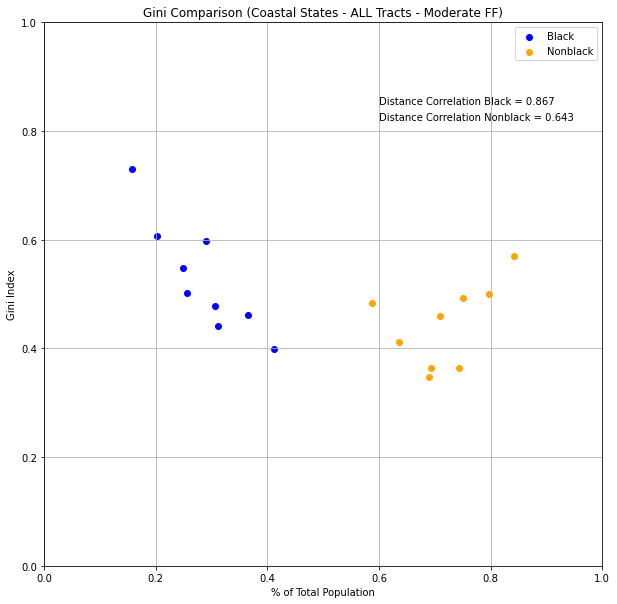

In [229]:
# correlation plotting (gini - pop density)
fig, ax = plt.subplots(figsize=(10,10))

ax.scatter(df_black['popblack']/df_black['poptotal'], df_black['Gini_black'], color='blue')
ax.scatter(df_black['popnonblack']/df_black['poptotal'], df_black['Gini_nonblack'], color='orange')

ax.set_title('Gini Comparison (Coastal States - ALL Tracts - Moderate FF)')
ax.set_xlim(0,1)
ax.set_ylim(0,1)
ax.set_xlabel('% of Total Population')
ax.set_ylabel('Gini Index')
ax.legend(['Black','Nonblack'],loc=1)
ax.grid(True)

dcor_black = dcor.distance_correlation(df_black['popblack']/df_black['poptotal'], df_black['Gini_black'])
dcor_nonblack = dcor.distance_correlation(df_black['popnonblack']/df_black['poptotal'], df_black['Gini_nonblack'])
ax.annotate('Distance Correlation Black = ''%.3f'%(dcor_black),xy=(0.6,0.85),xytext=(0.6,0.85),fontsize=10)
ax.annotate('Distance Correlation Nonblack = ''%.3f'%(dcor_nonblack),xy=(0.6,0.82),xytext=(0.6,0.82),fontsize=10)

plt.savefig('results/ComparisonPlots/CoastalStates/CoastalStates_black_gini_pd', dpi=300, bbox_inches='tight')

### Hispanic and Nonhispanic

In [230]:
import os
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import dcor

In [231]:
df_all = pd.read_csv('data/tract_all.csv')
df_all = df_all.rename(columns={'pop_total':'total'})
df_all = df_all.dropna(subset=['GEOID','NAME','total','hisp','hisp','FFsum3up'])
df_all = df_all[df_all['FFsum3up'] != 0]

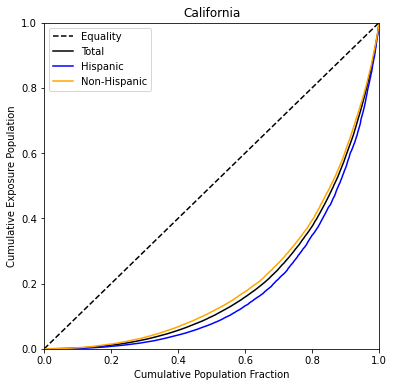

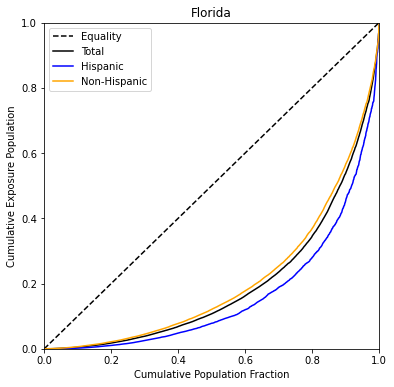

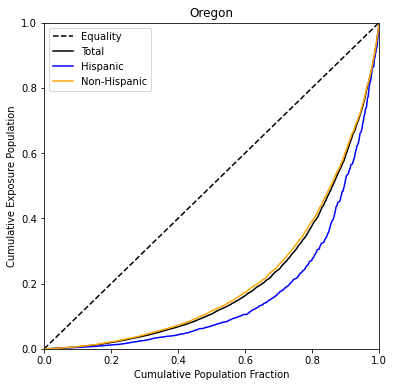

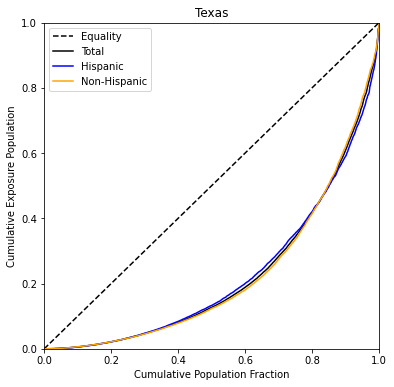

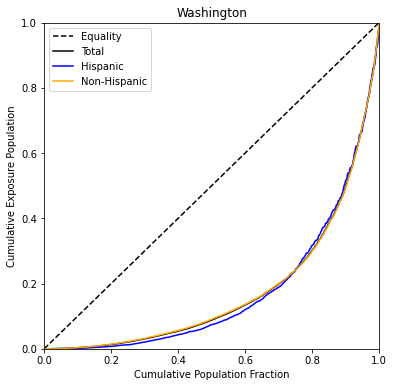

In [232]:
# lorenz curves
hispstates = ['California', 'Florida',  'Oregon', 'Texas', 'Washington']

for i in hispstates:
    # start of calculations
    df_state = df_all[df_all['NAME'].str.endswith(i)]
    
    df_state_total = df_state[['GEOID','NAME','total','FFsum3up']]
    df_state_total = df_state_total.sort_values(by=['FFsum3up'],ascending=True) # weighted FF sum serves as the "exposure" value for sorting and analysis
    df_state_total['cum_pop'] = df_state_total['total'].cumsum()
    df_state_total['cum_FFsum3up'] = df_state_total['FFsum3up'].cumsum()
    df_state_total['normalized_pop'] = df_state_total['cum_pop']/df_state_total['total'].sum()
    df_state_total['normalized_FFsum3up'] = df_state_total['cum_FFsum3up']/df_state_total['FFsum3up'].sum()
    
    df_state_hisp = df_state[['GEOID','NAME','hisp','FFsum3up']]
    df_state_hisp = df_state_hisp.sort_values(by=['FFsum3up'],ascending=True)
    df_state_hisp['cum_pop'] = df_state_hisp['hisp'].cumsum()
    df_state_hisp['cum_FFsum3up'] = df_state_hisp['FFsum3up'].cumsum()
    df_state_hisp['normalized_pop'] = df_state_hisp['cum_pop']/df_state_hisp['hisp'].sum()
    df_state_hisp['normalized_FFsum3up'] = df_state_hisp['cum_FFsum3up']/df_state_hisp['FFsum3up'].sum()
    
    df_state_nonhisp = df_state[['GEOID','NAME','nonhisp','FFsum3up']]
    df_state_nonhisp = df_state_nonhisp.sort_values(by=['FFsum3up'],ascending=True)
    df_state_nonhisp['cum_pop'] = df_state_nonhisp['nonhisp'].cumsum()
    df_state_nonhisp['cum_FFsum3up'] = df_state_nonhisp['FFsum3up'].cumsum()
    df_state_nonhisp['normalized_pop'] = df_state_nonhisp['cum_pop']/df_state_nonhisp['nonhisp'].sum()
    df_state_nonhisp['normalized_FFsum3up'] = df_state_nonhisp['cum_FFsum3up']/df_state_nonhisp['FFsum3up'].sum()
    # end of calculations
    
    # start of plotting
    fig, ax = plt.subplots(figsize=(6,6))
    ax.set_title(i)
    
    x = np.arange(0, 1.1, 0.1) # equations to define eqaulity
    y = x
    
    ax.plot(x, y, color='black',linestyle='--')
    ax.plot(df_state_total['normalized_pop'],df_state_total['normalized_FFsum3up'],color='black',linestyle='-')
    ax.plot(df_state_hisp['normalized_pop'],df_state_hisp['normalized_FFsum3up'],color='blue',linestyle='-')
    ax.plot(df_state_nonhisp['normalized_pop'],df_state_nonhisp['normalized_FFsum3up'],color='orange',linestyle='-')
    
    ax.set_xlim(0,1)
    ax.set_ylim(0,1)
    ax.set_xlabel('Cumulative Population Fraction')
    ax.set_ylabel('Cumulative Exposure Population')
    ax.legend(['Equality','Total','Hispanic','Non-Hispanic'],loc=2)
    
    plt.savefig('results/LorenzCurves/CoastalStates/'+i+'_hisp', dpi=300, bbox_inches='tight')
    # end of plotting

In [233]:
# csv generation (gini, I)
hispstates = ['California', 'Florida',  'Oregon', 'Texas', 'Washington']

df_coastalstates = pd.DataFrame(columns=['State','poptotal','pophisp','popnonhisp','Gini_total','Gini_hisp','Gini_nonhisp','II_total','II_hisp','II_nonhisp','dc_total','dc_hisp','dc_nonhisp','Area_km2','medHincome','medHvalue','edu'])

for i in hispstates:
    # start of calculations
    df_state = df_all[df_all['NAME'].str.endswith(i)]
    
    df_state_total = df_state[['GEOID','NAME','total','FFsum3up','Area_km2','medHincome','medHvalue','edu']]
    df_state_total = df_state_total.sort_values(by=['FFsum3up'],ascending=True) # weighted FF sum serves as the "exposure" value for sorting and analysis
    df_state_total['cum_pop'] = df_state_total['total'].cumsum()
    df_state_total['cum_FFsum3up'] = df_state_total['FFsum3up'].cumsum()
    df_state_total['normalized_pop'] = df_state_total['cum_pop']/df_state_total['total'].sum()
    df_state_total['normalized_FFsum3up'] = df_state_total['cum_FFsum3up']/df_state_total['FFsum3up'].sum()
    
    df_state_hisp = df_state[['GEOID','NAME','hisp','FFsum3up']]
    df_state_hisp = df_state_hisp.sort_values(by=['FFsum3up'],ascending=True)
    df_state_hisp['cum_pop'] = df_state_hisp['hisp'].cumsum()
    df_state_hisp['cum_FFsum3up'] = df_state_hisp['FFsum3up'].cumsum()
    df_state_hisp['normalized_pop'] = df_state_hisp['cum_pop']/df_state_hisp['hisp'].sum()
    df_state_hisp['normalized_FFsum3up'] = df_state_hisp['cum_FFsum3up']/df_state_hisp['FFsum3up'].sum()
    
    df_state_nonhisp = df_state[['GEOID','NAME','nonhisp','FFsum3up']]
    df_state_nonhisp = df_state_nonhisp.sort_values(by=['FFsum3up'],ascending=True)
    df_state_nonhisp['cum_pop'] = df_state_nonhisp['nonhisp'].cumsum()
    df_state_nonhisp['cum_FFsum3up'] = df_state_nonhisp['FFsum3up'].cumsum()
    df_state_nonhisp['normalized_pop'] = df_state_nonhisp['cum_pop']/df_state_nonhisp['nonhisp'].sum()
    df_state_nonhisp['normalized_FFsum3up'] = df_state_nonhisp['cum_FFsum3up']/df_state_nonhisp['FFsum3up'].sum()
    
    poptotal = df_state_total['total'].sum()
    pophisp = df_state_hisp['hisp'].sum()
    popnonhisp = df_state_nonhisp['nonhisp'].sum()
    
    Gini_total = (0.5 - np.trapz(df_state_total['normalized_FFsum3up'],df_state_total['normalized_pop']))/0.5
    Gini_hisp = (0.5 - np.trapz(df_state_hisp['normalized_FFsum3up'],df_state_hisp['normalized_pop']))/0.5
    Gini_nonhisp = (0.5 - np.trapz(df_state_nonhisp['normalized_FFsum3up'],df_state_nonhisp['normalized_pop']))/0.5
    
    B10T10_total = np.percentile(df_state_total['normalized_FFsum3up'],10)/(1-np.percentile(df_state_total['normalized_FFsum3up'],90))
    B10T10_hisp = np.percentile(df_state_hisp['normalized_FFsum3up'],10)/(1-np.percentile(df_state_hisp['normalized_FFsum3up'],90))
    B10T10_nonhisp = np.percentile(df_state_nonhisp['normalized_FFsum3up'],10)/(1-np.percentile(df_state_nonhisp['normalized_FFsum3up'],90))
    II_total = np.sqrt((Gini_total**2)+(((1-B10T10_total)**(1/4))**2))/np.sqrt(2) # value of 1/4 is used by Sitthyot et al. (2020), this alpha value is based, then rounded for practicality, on average of all country Gini values
    II_hisp = np.sqrt((Gini_hisp**2)+(((1-B10T10_hisp)**(1/4))**2))/np.sqrt(2)
    II_nonhisp = np.sqrt((Gini_nonhisp**2)+(((1-B10T10_nonhisp)**(1/4))**2))/np.sqrt(2)
    
    dc_total = dcor.distance_correlation(df_state_total['normalized_pop'],df_state_total['normalized_FFsum3up'])
    dc_hisp = dcor.distance_correlation(df_state_hisp['normalized_pop'],df_state_hisp['normalized_FFsum3up'])
    dc_nonhisp = dcor.distance_correlation(df_state_nonhisp['normalized_pop'],df_state_nonhisp['normalized_FFsum3up'])
    
    Area_km2 = df_state_total['Area_km2'].sum()
    medHincome_ave = df_state_total['medHincome'].mean()
    medHvalue_ave = df_state_total['medHvalue'].mean()
    edu_ave = (df_state_total['edu']/df_state_total['total']).mean()
    # end of calculations
    
    # start of results synthesis
    df_coastalstates = df_coastalstates.append({'State':i,'poptotal':poptotal,'pophisp':pophisp,'popnonhisp':popnonhisp,
                                                'Gini_total':Gini_total,'Gini_hisp':Gini_hisp,'Gini_nonhisp':Gini_nonhisp,
                                                'II_total':II_total,'II_hisp':II_hisp,'II_nonhisp':II_nonhisp,
                                                'dc_total':dc_total,'dc_hisp':dc_hisp,'dc_nonhisp':dc_nonhisp,
                                                'Area_km2':Area_km2,'medHincome':medHincome_ave,'medHvalue':medHvalue_ave,'edu':edu_ave}, ignore_index=True)
    
df_coastalstates.to_csv('results/csvs/CoastalStates_hisp.csv', index=False)
# end of results synthesis

In [234]:
# reading generated csv
df_hisp = pd.read_csv('results/csvs/CoastalStates_hisp.csv')

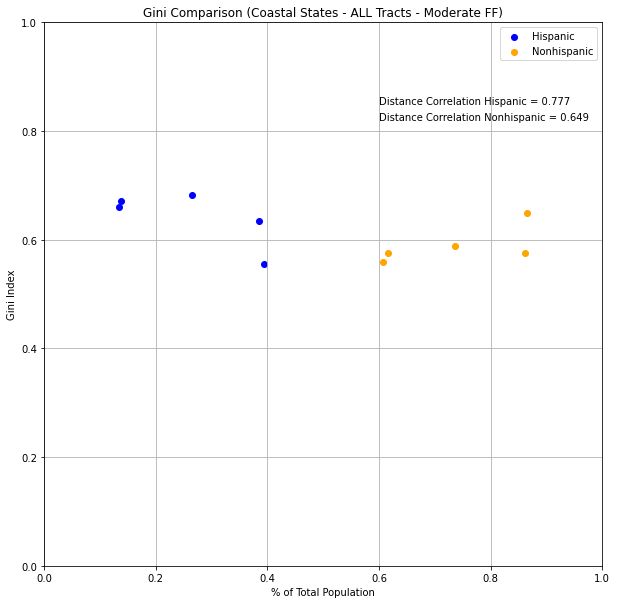

In [235]:
# correlation plotting (gini - pop density)
fig, ax = plt.subplots(figsize=(10,10))

ax.scatter(df_hisp['pophisp']/df_hisp['poptotal'], df_hisp['Gini_hisp'], color='blue')
ax.scatter(df_hisp['popnonhisp']/df_hisp['poptotal'], df_hisp['Gini_nonhisp'], color='orange')

ax.set_title('Gini Comparison (Coastal States - ALL Tracts - Moderate FF)')
ax.set_xlim(0,1)
ax.set_ylim(0,1)
ax.set_xlabel('% of Total Population')
ax.set_ylabel('Gini Index')
ax.legend(['Hispanic','Nonhispanic'],loc=1)
ax.grid(True)

dcor_hisp = dcor.distance_correlation(df_hisp['pophisp']/df_hisp['poptotal'], df_hisp['Gini_hisp'])
dcor_nonhisp = dcor.distance_correlation(df_hisp['popnonhisp']/df_hisp['poptotal'], df_hisp['Gini_nonhisp'])
ax.annotate('Distance Correlation Hispanic = ''%.3f'%(dcor_hisp),xy=(0.6,0.85),xytext=(0.6,0.85),fontsize=10)
ax.annotate('Distance Correlation Nonhispanic = ''%.3f'%(dcor_nonhisp),xy=(0.6,0.82),xytext=(0.6,0.82),fontsize=10)

plt.savefig('results/ComparisonPlots/CoastalStates/CoastalStates_hisp_gini_pd', dpi=300, bbox_inches='tight')

## Coastal States (ONLY Coastal Counties/Tracts)

States (including D.C.) in the contiguous U.S. containing coastal counties according to NOAA Fisheries. Analysis based only on tracts contained within those coastal counties.

    https://www.fisheries.noaa.gov/inport/item/66112
    Includes AL and HI (NOT included in analysis)

### White and Nonwhite

In [236]:
import os
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import dcor

In [237]:
df_coastalcounties = pd.read_csv('data/tract_coastalcounties.csv')
df_coastalcounties = df_coastalcounties.rename(columns={'pop_total':'total'})
df_coastalcounties = df_coastalcounties.dropna(subset=['GEOID','NAME','total','white','nonwhite','FFsum3up'])
df_coastalcounties = df_coastalcounties[df_coastalcounties['FFsum3up'] != 0]

C:\Program Files\ArcGIS\Pro\bin\Python\envs\arcgispro-py3\lib\site-packages\ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


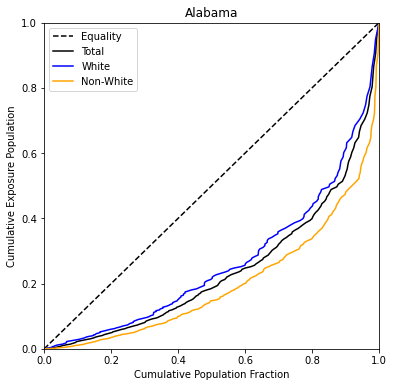

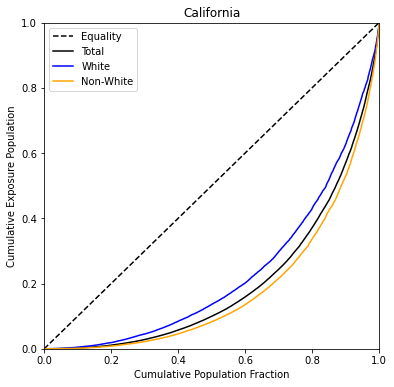

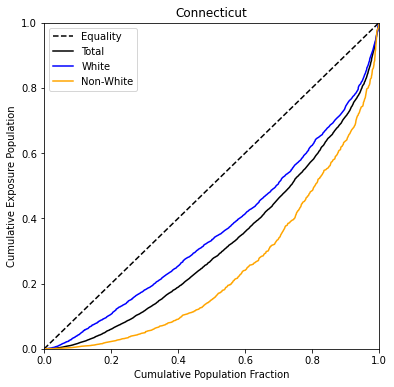

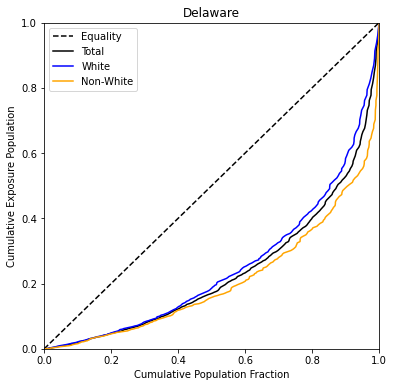

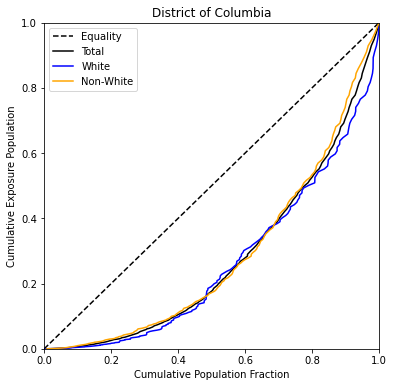

...

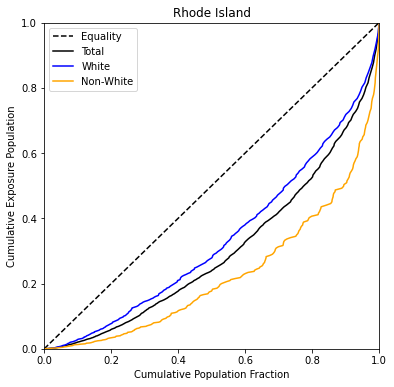

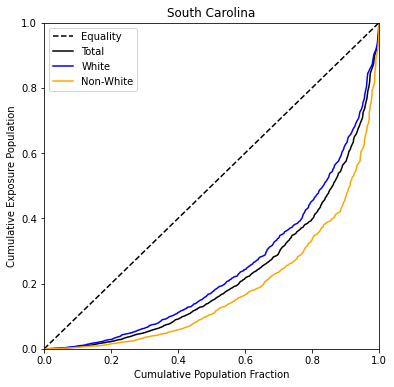

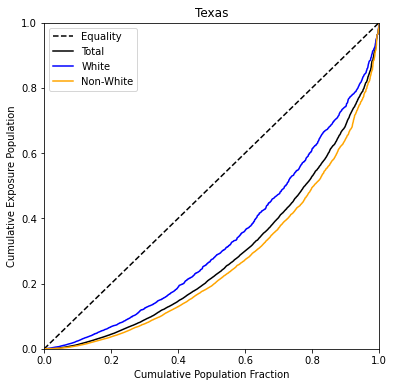

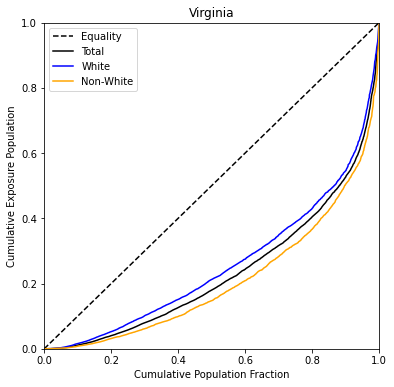

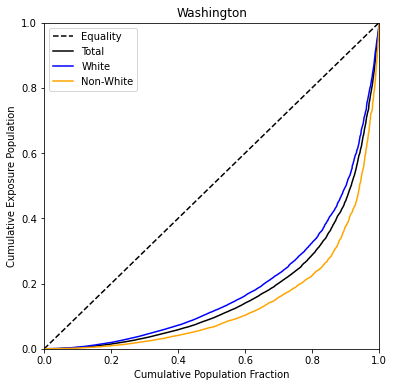

In [238]:
# lorenz curves
coastalstates = ['Alabama', 'California', 'Connecticut', 'Delaware', 'District of Columbia', 
                 'Florida', 'Georgia', 'Louisiana', 'Maine', 'Maryland', 
                 'Massachusetts', 'Mississippi', 'New Hampshire', 'New Jersey', 'New York', 
                 'North Carolina', 'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina', 
                 'Texas', 'Virginia', 'Washington']

for i in coastalstates:
    # start of calculations
    df_state = df_coastalcounties[df_coastalcounties['NAME'].str.endswith(i)]
    
    df_state_total = df_state[['GEOID','NAME','total','FFsum3up']]
    df_state_total = df_state_total.sort_values(by=['FFsum3up'],ascending=True) # weighted FF sum serves as the "exposure" value for sorting and analysis
    df_state_total['cum_pop'] = df_state_total['total'].cumsum()
    df_state_total['cum_FFsum3up'] = df_state_total['FFsum3up'].cumsum()
    df_state_total['normalized_pop'] = df_state_total['cum_pop']/df_state_total['total'].sum()
    df_state_total['normalized_FFsum3up'] = df_state_total['cum_FFsum3up']/df_state_total['FFsum3up'].sum()
    
    df_state_white = df_state[['GEOID','NAME','white','FFsum3up']]
    df_state_white = df_state_white.sort_values(by=['FFsum3up'],ascending=True)
    df_state_white['cum_pop'] = df_state_white['white'].cumsum()
    df_state_white['cum_FFsum3up'] = df_state_white['FFsum3up'].cumsum()
    df_state_white['normalized_pop'] = df_state_white['cum_pop']/df_state_white['white'].sum()
    df_state_white['normalized_FFsum3up'] = df_state_white['cum_FFsum3up']/df_state_white['FFsum3up'].sum()
    
    df_state_nonwhite = df_state[['GEOID','NAME','nonwhite','FFsum3up']]
    df_state_nonwhite = df_state_nonwhite.sort_values(by=['FFsum3up'],ascending=True)
    df_state_nonwhite['cum_pop'] = df_state_nonwhite['nonwhite'].cumsum()
    df_state_nonwhite['cum_FFsum3up'] = df_state_nonwhite['FFsum3up'].cumsum()
    df_state_nonwhite['normalized_pop'] = df_state_nonwhite['cum_pop']/df_state_nonwhite['nonwhite'].sum()
    df_state_nonwhite['normalized_FFsum3up'] = df_state_nonwhite['cum_FFsum3up']/df_state_nonwhite['FFsum3up'].sum()
    # end of calculations
    
    # start of plotting
    fig, ax = plt.subplots(figsize=(6,6))
    ax.set_title(i)
    
    x = np.arange(0, 1.1, 0.1) # equations to define eqaulity
    y = x
    
    ax.plot(x, y, color='black',linestyle='--')
    ax.plot(df_state_total['normalized_pop'],df_state_total['normalized_FFsum3up'],color='black',linestyle='-')
    ax.plot(df_state_white['normalized_pop'],df_state_white['normalized_FFsum3up'],color='blue',linestyle='-')
    ax.plot(df_state_nonwhite['normalized_pop'],df_state_nonwhite['normalized_FFsum3up'],color='orange',linestyle='-')
    
    ax.set_xlim(0,1)
    ax.set_ylim(0,1)
    ax.set_xlabel('Cumulative Population Fraction')
    ax.set_ylabel('Cumulative Exposure Population')
    ax.legend(['Equality','Total','White','Non-White'],loc=2)
    
    plt.savefig('results/LorenzCurves/CoastalStates_CC/'+i+'_white', dpi=300, bbox_inches='tight')
    # end of plotting

In [239]:
# csv generation (gini, I)
coastalstates = ['Alabama', 'California', 'Connecticut', 'Delaware', 'District of Columbia', 
                 'Florida', 'Georgia', 'Louisiana', 'Maine', 'Maryland', 
                 'Massachusetts', 'Mississippi', 'New Hampshire', 'New Jersey', 'New York', 
                 'North Carolina', 'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina', 
                 'Texas', 'Virginia', 'Washington']

df_coastalstates_CC = pd.DataFrame(columns=['State','poptotal','popwhite','popnonwhite','Gini_total','Gini_white','Gini_nonwhite','II_total','II_white','II_nonwhite','dc_total','dc_white','dc_nonwhite','Area_km2','medHincome','medHvalue','edu'])

for i in coastalstates:
    # start of calculations
    df_state = df_coastalcounties[df_coastalcounties['NAME'].str.endswith(i)]
    
    df_state_total = df_state[['GEOID','NAME','total','FFsum3up','Area_km2','medHincome','medHvalue','edu']]
    df_state_total = df_state_total.sort_values(by=['FFsum3up'],ascending=True) # weighted FF sum serves as the "exposure" value for sorting and analysis
    df_state_total['cum_pop'] = df_state_total['total'].cumsum()
    df_state_total['cum_FFsum3up'] = df_state_total['FFsum3up'].cumsum()
    df_state_total['normalized_pop'] = df_state_total['cum_pop']/df_state_total['total'].sum()
    df_state_total['normalized_FFsum3up'] = df_state_total['cum_FFsum3up']/df_state_total['FFsum3up'].sum()
    
    df_state_white = df_state[['GEOID','NAME','white','FFsum3up']]
    df_state_white = df_state_white.sort_values(by=['FFsum3up'],ascending=True)
    df_state_white['cum_pop'] = df_state_white['white'].cumsum()
    df_state_white['cum_FFsum3up'] = df_state_white['FFsum3up'].cumsum()
    df_state_white['normalized_pop'] = df_state_white['cum_pop']/df_state_white['white'].sum()
    df_state_white['normalized_FFsum3up'] = df_state_white['cum_FFsum3up']/df_state_white['FFsum3up'].sum()
    
    df_state_nonwhite = df_state[['GEOID','NAME','nonwhite','FFsum3up']]
    df_state_nonwhite = df_state_nonwhite.sort_values(by=['FFsum3up'],ascending=True)
    df_state_nonwhite['cum_pop'] = df_state_nonwhite['nonwhite'].cumsum()
    df_state_nonwhite['cum_FFsum3up'] = df_state_nonwhite['FFsum3up'].cumsum()
    df_state_nonwhite['normalized_pop'] = df_state_nonwhite['cum_pop']/df_state_nonwhite['nonwhite'].sum()
    df_state_nonwhite['normalized_FFsum3up'] = df_state_nonwhite['cum_FFsum3up']/df_state_nonwhite['FFsum3up'].sum()
    
    poptotal = df_state_total['total'].sum()
    popwhite = df_state_white['white'].sum()
    popnonwhite = df_state_nonwhite['nonwhite'].sum()
    
    Gini_total = (0.5 - np.trapz(df_state_total['normalized_FFsum3up'],df_state_total['normalized_pop']))/0.5
    Gini_white = (0.5 - np.trapz(df_state_white['normalized_FFsum3up'],df_state_white['normalized_pop']))/0.5
    Gini_nonwhite = (0.5 - np.trapz(df_state_nonwhite['normalized_FFsum3up'],df_state_nonwhite['normalized_pop']))/0.5
    
    B10T10_total = np.percentile(df_state_total['normalized_FFsum3up'],10)/(1-np.percentile(df_state_total['normalized_FFsum3up'],90))
    B10T10_white = np.percentile(df_state_white['normalized_FFsum3up'],10)/(1-np.percentile(df_state_white['normalized_FFsum3up'],90))
    B10T10_nonwhite = np.percentile(df_state_nonwhite['normalized_FFsum3up'],10)/(1-np.percentile(df_state_nonwhite['normalized_FFsum3up'],90))
    II_total = np.sqrt((Gini_total**2)+(((1-B10T10_total)**(1/4))**2))/np.sqrt(2) # value of 1/4 is used by Sitthyot et al. (2020), this alpha value is based, then rounded for practicality, on average of all country Gini values
    II_white = np.sqrt((Gini_white**2)+(((1-B10T10_white)**(1/4))**2))/np.sqrt(2)
    II_nonwhite = np.sqrt((Gini_nonwhite**2)+(((1-B10T10_nonwhite)**(1/4))**2))/np.sqrt(2)
    
    dc_total = dcor.distance_correlation(df_state_total['normalized_pop'],df_state_total['normalized_FFsum3up'])
    dc_white = dcor.distance_correlation(df_state_white['normalized_pop'],df_state_white['normalized_FFsum3up'])
    dc_nonwhite = dcor.distance_correlation(df_state_nonwhite['normalized_pop'],df_state_nonwhite['normalized_FFsum3up'])
    
    Area_km2 = df_state_total['Area_km2'].sum()
    medHincome_ave = df_state_total['medHincome'].mean()
    medHvalue_ave = df_state_total['medHvalue'].mean()
    edu_ave = (df_state_total['edu']/df_state_total['total']).mean()
    # end of calculations
    
    # start of results synthesis
    df_coastalstates = df_coastalstates.append({'State':i,'poptotal':poptotal,'popwhite':popwhite,'popnonwhite':popnonwhite,
                                                'Gini_total':Gini_total,'Gini_white':Gini_white,'Gini_nonwhite':Gini_nonwhite,
                                                'II_total':II_total,'II_white':II_white,'II_nonwhite':II_nonwhite,
                                                'dc_total':dc_total,'dc_white':dc_white,'dc_nonwhite':dc_nonwhite,
                                                'Area_km2':Area_km2,'medHincome':medHincome_ave,'medHvalue':medHvalue_ave,'edu':edu_ave}, ignore_index=True)
    
df_coastalstates_CC.to_csv('results/csvs/CoastalStates_CC_white.csv', index=False)
# end of results synthesis

## Coastal Counties

Coastal counties within states (including D.C.) in the contiguous U.S. according to NOAA Fisheries.

    https://www.fisheries.noaa.gov/inport/item/66112
    Includes AL and HI (NOT included in analysis)

### White and Nonwhite

In [240]:
import os
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import dcor

In [241]:
df_coastalcounties = pd.read_csv('data/tract_coastalcounties.csv')
df_coastalcounties = df_coastalcounties.rename(columns={'pop_total':'total'})
df_coastalcounties = df_coastalcounties.dropna(subset=['GEOID','NAME','total','white','nonwhite','FFsum'])
df_coastalcounties = df_coastalcounties[df_coastalcounties['FFsum3up'] != 0]

# refinement of data
df_coastalcounties_refinement = df_coastalcounties.groupby('COUNTY')['GEOID'].nunique()
df_coastalcounties_refinement = df_coastalcounties_refinement[df_coastalcounties_refinement > 5] # excludes counties that have less than 6 census tracts
df_coastalcounties_refined = pd.merge(left=df_coastalcounties, right=df_coastalcounties_refinement, how='right', on='COUNTY')
df_coastalcounties_refined = df_coastalcounties_refined.sort_values(by='OID_')

C:\Program Files\ArcGIS\Pro\bin\Python\envs\arcgispro-py3\lib\site-packages\ipykernel_launcher.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


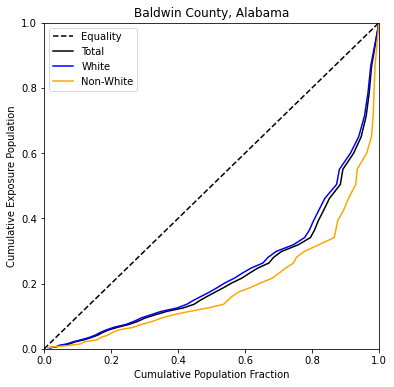

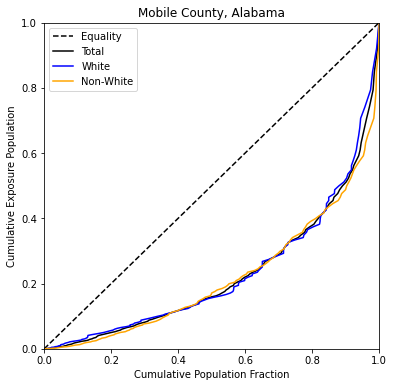

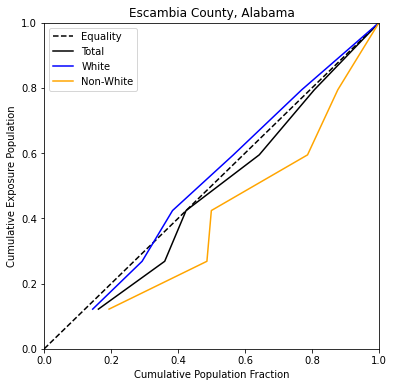

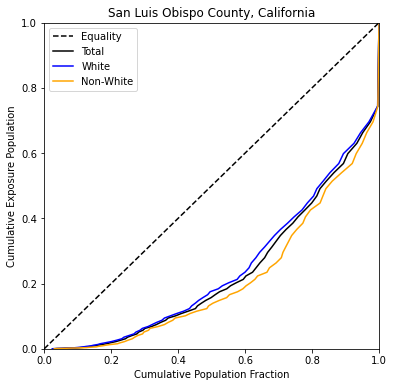

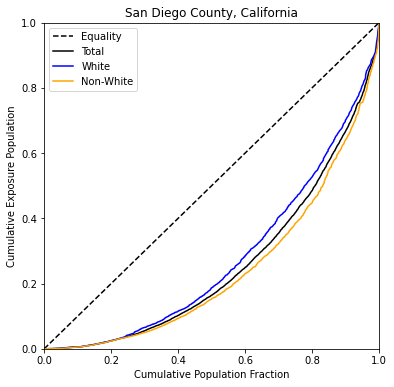

...

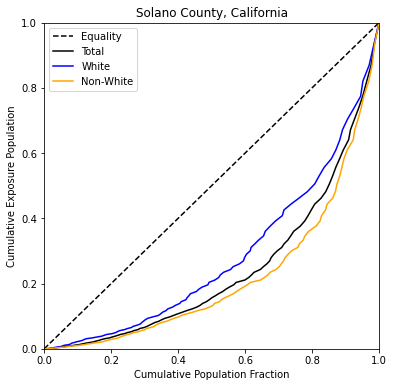

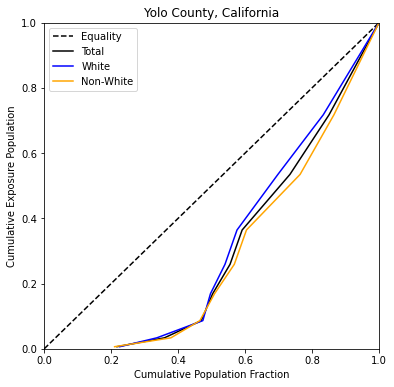

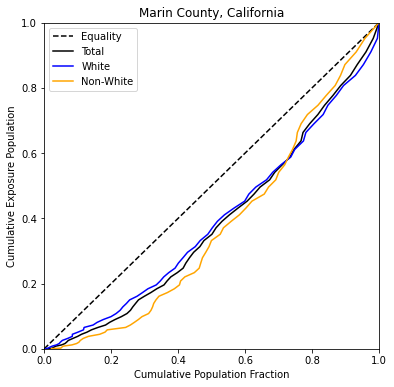

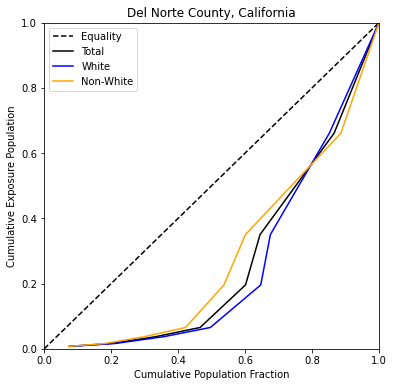

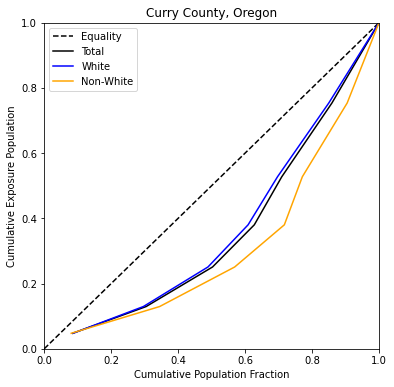

In [242]:
# lorenz curves
coastalcounties = df_coastalcounties_refined['COUNTY'].unique()

for i in coastalcounties:
    # start of calculations
    df_county = df_coastalcounties_refined[df_coastalcounties_refined['NAME'].str.endswith(i)]
    
    df_county_total = df_county[['GEOID_x','NAME','total','FFsum3up']]
    df_county_total = df_county_total.sort_values(by=['FFsum3up'],ascending=True) # weighted FF sum serves as the "exposure" value for sorting and analysis
    df_county_total['cum_pop'] = df_county_total['total'].cumsum()
    df_county_total['cum_FFsum3up'] = df_county_total['FFsum3up'].cumsum()
    df_county_total['normalized_pop'] = df_county_total['cum_pop']/df_county_total['total'].sum()
    df_county_total['normalized_FFsum3up'] = df_county_total['cum_FFsum3up']/df_county_total['FFsum3up'].sum()
    
    df_county_white = df_county[['GEOID_x','NAME','white','FFsum3up']]
    df_county_white = df_county_white.sort_values(by=['FFsum3up'],ascending=True)
    df_county_white['cum_pop'] = df_county_white['white'].cumsum()
    df_county_white['cum_FFsum3up'] = df_county_white['FFsum3up'].cumsum()
    df_county_white['normalized_pop'] = df_county_white['cum_pop']/df_county_white['white'].sum()
    df_county_white['normalized_FFsum3up'] = df_county_white['cum_FFsum3up']/df_county_white['FFsum3up'].sum()
    
    df_county_nonwhite = df_county[['GEOID_x','NAME','nonwhite','FFsum3up']]
    df_county_nonwhite = df_county_nonwhite.sort_values(by=['FFsum3up'],ascending=True)
    df_county_nonwhite['cum_pop'] = df_county_nonwhite['nonwhite'].cumsum()
    df_county_nonwhite['cum_FFsum3up'] = df_county_nonwhite['FFsum3up'].cumsum()
    df_county_nonwhite['normalized_pop'] = df_county_nonwhite['cum_pop']/df_county_nonwhite['nonwhite'].sum()
    df_county_nonwhite['normalized_FFsum3up'] = df_county_nonwhite['cum_FFsum3up']/df_county_nonwhite['FFsum3up'].sum()
    # end of calculations
    
    # start of plotting
    fig, ax = plt.subplots(figsize=(6,6))
    ax.set_title(i)
    
    x = np.arange(0, 1.1, 0.1) # equations to define eqaulity
    y = x
    
    ax.plot(x, y, color='black',linestyle='--')
    ax.plot(df_county_total['normalized_pop'],df_county_total['normalized_FFsum3up'],color='black',linestyle='-')
    ax.plot(df_county_white['normalized_pop'],df_county_white['normalized_FFsum3up'],color='blue',linestyle='-')
    ax.plot(df_county_nonwhite['normalized_pop'],df_county_nonwhite['normalized_FFsum3up'],color='orange',linestyle='-')
    
    ax.set_xlim(0,1)
    ax.set_ylim(0,1)
    ax.set_xlabel('Cumulative Population Fraction')
    ax.set_ylabel('Cumulative Exposure Population')
    ax.legend(['Equality','Total','White','Non-White'],loc=2)
    
    plt.savefig('results/LorenzCurves/CoastalCounties/'+i+'.png', dpi=300, bbox_inches='tight')
    # end of plotting

In [243]:
# csv generation (gini, I)
coastalcounties = df_coastalcounties_refined['COUNTY'].unique()

df_coastalcounties = pd.DataFrame(columns=['County','poptotal','popwhite','popnonwhite','Gini_total','Gini_white','Gini_nonwhite','II_total','II_white','II_nonwhite','dc_total','dc_white','dc_nonwhite','Area_km2','medHincome','medHvalue','edu'])

for i in coastalcounties:
    # start of calculations
    df_county = df_coastalcounties_refined[df_coastalcounties_refined['NAME'].str.endswith(i)]
    
    df_county_total = df_county[['GEOID_x','NAME','total','FFsum3up','Area_km2','medHincome','medHvalue','edu']]
    df_county_total = df_county_total.sort_values(by=['FFsum3up'],ascending=True) # weighted FF sum serves as the "exposure" value for sorting and analysis
    df_county_total['cum_pop'] = df_county_total['total'].cumsum()
    df_county_total['cum_FFsum3up'] = df_county_total['FFsum3up'].cumsum()
    df_county_total['normalized_pop'] = df_county_total['cum_pop']/df_county_total['total'].sum()
    df_county_total['normalized_FFsum3up'] = df_county_total['cum_FFsum3up']/df_county_total['FFsum3up'].sum()
    
    df_county_white = df_county[['GEOID_x','NAME','white','FFsum3up']]
    df_county_white = df_county_white.sort_values(by=['FFsum3up'],ascending=True)
    df_county_white['cum_pop'] = df_county_white['white'].cumsum()
    df_county_white['cum_FFsum3up'] = df_county_white['FFsum3up'].cumsum()
    df_county_white['normalized_pop'] = df_county_white['cum_pop']/df_county_white['white'].sum()
    df_county_white['normalized_FFsum3up'] = df_county_white['cum_FFsum3up']/df_county_white['FFsum3up'].sum()
    
    df_county_nonwhite = df_county[['GEOID_x','NAME','nonwhite','FFsum3up']]
    df_county_nonwhite = df_county_nonwhite.sort_values(by=['FFsum3up'],ascending=True)
    df_county_nonwhite['cum_pop'] = df_county_nonwhite['nonwhite'].cumsum()
    df_county_nonwhite['cum_FFsum3up'] = df_county_nonwhite['FFsum3up'].cumsum()
    df_county_nonwhite['normalized_pop'] = df_county_nonwhite['cum_pop']/df_county_nonwhite['nonwhite'].sum()
    df_county_nonwhite['normalized_FFsum3up'] = df_county_nonwhite['cum_FFsum3up']/df_county_nonwhite['FFsum3up'].sum()
    
    poptotal = df_county_total['total'].sum()
    popwhite = df_county_white['white'].sum()
    popnonwhite = df_county_nonwhite['nonwhite'].sum()
    
    Gini_total = (0.5 - np.trapz(df_county_total['normalized_FFsum3up'],df_county_total['normalized_pop']))/0.5
    Gini_white = (0.5 - np.trapz(df_county_white['normalized_FFsum3up'],df_county_white['normalized_pop']))/0.5
    Gini_nonwhite = (0.5 - np.trapz(df_county_nonwhite['normalized_FFsum3up'],df_county_nonwhite['normalized_pop']))/0.5
    
    B10T10_total = np.percentile(df_county_total['normalized_FFsum3up'],10)/(1-np.percentile(df_county_total['normalized_FFsum3up'],90))
    B10T10_white = np.percentile(df_county_white['normalized_FFsum3up'],10)/(1-np.percentile(df_county_white['normalized_FFsum3up'],90))
    B10T10_nonwhite = np.percentile(df_county_nonwhite['normalized_FFsum3up'],10)/(1-np.percentile(df_county_nonwhite['normalized_FFsum3up'],90))
    II_total = np.sqrt((Gini_total**2)+(((1-B10T10_total)**(1/4))**2))/np.sqrt(2) # value of 1/4 is used by Sitthyot et al. (2020), this alpha value is based, then rounded for practicality, on average of all country Gini values
    II_white = np.sqrt((Gini_white**2)+(((1-B10T10_white)**(1/4))**2))/np.sqrt(2)
    II_nonwhite = np.sqrt((Gini_nonwhite**2)+(((1-B10T10_nonwhite)**(1/4))**2))/np.sqrt(2)
    
    dc_total = dcor.distance_correlation(df_county_total['normalized_pop'],df_county_total['normalized_FFsum3up'])
    dc_white = dcor.distance_correlation(df_county_white['normalized_pop'],df_county_white['normalized_FFsum3up'])
    dc_nonwhite = dcor.distance_correlation(df_county_nonwhite['normalized_pop'],df_county_nonwhite['normalized_FFsum3up'])
    
    Area_km2 = df_county_total['Area_km2'].sum()
    medHincome_ave = df_county_total['medHincome'].mean()
    medHvalue_ave = df_county_total['medHvalue'].mean()
    edu_ave = (df_county_total['edu']/df_county_total['total']).mean()
    # end of calculations
    
    # start of results synthesis
    df_coastalcounties = df_coastalcounties.append({'County':i,'poptotal':poptotal,'popwhite':popwhite,'popnonwhite':popnonwhite,
                                                'Gini_total':Gini_total,'Gini_white':Gini_white,'Gini_nonwhite':Gini_nonwhite,
                                                'II_total':II_total,'II_white':II_white,'II_nonwhite':II_nonwhite,
                                                'dc_total':dc_total,'dc_white':dc_white,'dc_nonwhite':dc_nonwhite,
                                                'Area_km2':Area_km2,'medHincome':medHincome_ave,'medHvalue':medHvalue_ave,'edu':edu_ave}, ignore_index=True)
    
df_coastalcounties.to_csv('results/csvs/CoastalCounties_white.csv', index=False)
# end of results synthesis

C:\Program Files\ArcGIS\Pro\bin\Python\envs\arcgispro-py3\lib\site-packages\ipykernel_launcher.py:42: RuntimeWarning: invalid value encountered in double_scalars
C:\Program Files\ArcGIS\Pro\bin\Python\envs\arcgispro-py3\lib\site-packages\ipykernel_launcher.py:43: RuntimeWarning: invalid value encountered in double_scalars
C:\Program Files\ArcGIS\Pro\bin\Python\envs\arcgispro-py3\lib\site-packages\ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in double_scalars
